## 프로야구 관중수 예측

In [151]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [152]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from chronos import Chronos2Pipeline
from korean_font import set_korean_font

# ===== 실행 환경 설정 =====
USE_GPU = False  # GPU 사용: True, CPU 사용: False

DEVICE = "cuda" if USE_GPU and torch.cuda.is_available() else "cpu"
DTYPE = "bfloat16" if DEVICE == "cuda" else "float32"
# ==========================

plt.rcParams["figure.figsize"] = (12, 5)
plt.rcParams["font.size"] = 12
set_korean_font()

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"사용 디바이스: {DEVICE} (dtype: {DTYPE})")

한글 폰트 설정: AppleGothic
PyTorch version: 2.10.0
CUDA available: False
사용 디바이스: cpu (dtype: float32)


In [153]:
df = pd.read_csv('data/baseball/KBO_2023_2025_FINAL_MASTER_2160.csv',encoding='utf-8-sig')
df_weather2023 = pd.read_csv('data/baseball/weather2023.csv',encoding='cp949')

In [154]:
import pandas as pd

# 출력할 최대 컬럼 개수를 무제한(None)으로 설정
pd.set_option('display.max_columns', None)

print(df.head())

           날짜  경기_시간    상태    홈   방문  홈_점수  방문_점수  승리팀  경기_순번  더블헤더냐  \
0  2023-04-01  14:00  정상종료   KT   LG    11      6   KT      1      0   
1  2023-04-01  14:00  정상종료  SSG  KIA     4      1  SSG      1      0   
2  2023-04-01  14:00  정상종료   두산   롯데    12     10   두산      1      0   
3  2023-04-01  14:00  정상종료   삼성   NC     0      8   NC      1      0   
4  2023-04-01  14:00  정상종료   키움   한화     3      2   키움      1      0   

   실제_진행_순번 요일  구장    관중수 지점명     지점  평균기온(°C)  일강수량(mm)  평균 풍속(m/s)  \
0         1  토  수원  18700  수원  119.0      14.7       0.0         1.4   
1         1  토  문학  23000  인천  112.0      15.0       0.0         1.9   
2         1  토  잠실  23750  서울  108.0      17.5       0.0         1.8   
3         1  토  대구  24000  대구  143.0      15.0       0.0         3.3   
4         1  토  고척  16000  서울  108.0      17.5       0.0         1.8   

   합계 일사량(MJ/m2)  평균 전운량(1/10)    연도  
0          21.67           0.5  2023  
1          21.56           1.3  2023  
2          21.48 

In [155]:
# '지점명' 컬럼에서 '한밭'을 '대전'으로 치환!
df['구장'] = df['구장'].replace('한밭', '대전')

# 잘 바뀌었는지 확인 (대전이 리스트에 있는지 보세요!)
df[df['구장'] == '대전'].head()

,날짜,경기_시간,상태,홈,방문,홈_점수,방문_점수,승리팀,경기_순번,더블헤더냐,실제_진행_순번,요일,구장,관중수,지점명,지점,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10),연도
23,2023-04-07,18:30,정상종료,한화,SSG,3,7,SSG,1,0,1,금,대전,10415,대전,133.0,9.0,0.3,2.4,23.01,2.1,2023
28,2023-04-08,17:00,정상종료,한화,SSG,5,7,SSG,1,0,1,토,대전,11232,대전,133.0,8.6,0.0,2.8,24.68,0.9,2023
33,2023-04-09,14:00,정상종료,한화,SSG,0,3,SSG,1,0,1,일,대전,9455,대전,133.0,10.1,0.0,1.5,25.69,0.8,2023
67,2023-04-18,18:30,정상종료,한화,두산,0,2,두산,1,0,1,화,대전,4012,대전,133.0,13.8,1.3,0.8,2.81,9.8,2023
72,2023-04-19,18:30,정상종료,한화,두산,7,6,한화,1,0,1,수,대전,4212,대전,133.0,20.2,0.0,1.4,25.67,3.3,2023


In [156]:
# 1. 지점명이 NaN인 곳을 찾아 '대전'으로 채우기
df['지점명'] = df['지점명'].fillna('대전')

# 2. 잘 들어갔는지 확인!
print("현재 지점명 리스트:", df['지점명'].unique())
df[df['구장'] == '대전'].head()

현재 지점명 리스트: <StringArray>
['수원', '인천', '서울', '대구', '광주', '창원', '부산', '대전']
Length: 8, dtype: str


,날짜,경기_시간,상태,홈,방문,홈_점수,방문_점수,승리팀,경기_순번,더블헤더냐,실제_진행_순번,요일,구장,관중수,지점명,지점,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10),연도
23,2023-04-07,18:30,정상종료,한화,SSG,3,7,SSG,1,0,1,금,대전,10415,대전,133.0,9.0,0.3,2.4,23.01,2.1,2023
28,2023-04-08,17:00,정상종료,한화,SSG,5,7,SSG,1,0,1,토,대전,11232,대전,133.0,8.6,0.0,2.8,24.68,0.9,2023
33,2023-04-09,14:00,정상종료,한화,SSG,0,3,SSG,1,0,1,일,대전,9455,대전,133.0,10.1,0.0,1.5,25.69,0.8,2023
67,2023-04-18,18:30,정상종료,한화,두산,0,2,두산,1,0,1,화,대전,4012,대전,133.0,13.8,1.3,0.8,2.81,9.8,2023
72,2023-04-19,18:30,정상종료,한화,두산,7,6,한화,1,0,1,수,대전,4212,대전,133.0,20.2,0.0,1.4,25.67,3.3,2023


In [157]:
df_weather2023.head()

,지점,지점명,일시,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10)
0,108,서울,2023-04-01,17.5,NaN,1.8,21.48,1.8
1,108,서울,2023-04-02,18.8,NaN,2.4,24.08,0.4
2,108,서울,2023-04-03,19.0,NaN,2.3,22.95,4.1
3,108,서울,2023-04-04,17.6,6.9,2.6,10.78,9.1
4,108,서울,2023-04-05,11.9,50.3,3.4,1.56,10.0


In [158]:
# '일시' 컬럼을 '날짜'로 이름 바꾸기
df_weather2023.rename(columns={'일시': '날짜'}, inplace=True)

# 잘 바뀌었는지 상위 5개 행 다시 확인!
df_weather2023.head()

,지점,지점명,날짜,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10)
0,108,서울,2023-04-01,17.5,NaN,1.8,21.48,1.8
1,108,서울,2023-04-02,18.8,NaN,2.4,24.08,0.4
2,108,서울,2023-04-03,19.0,NaN,2.3,22.95,4.1
3,108,서울,2023-04-04,17.6,6.9,2.6,10.78,9.1
4,108,서울,2023-04-05,11.9,50.3,3.4,1.56,10.0


In [159]:
# '날짜' 컬럼이 여러 개일 때, 첫 번째 것만 남기고 나머지는 날리는 코드입니다.
df_weather2023 = df_weather2023.loc[:, ~df_weather2023.columns.duplicated()]

# 잘 지워졌는지 확인!
df_weather2023.head()

,지점,지점명,날짜,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10)
0,108,서울,2023-04-01,17.5,NaN,1.8,21.48,1.8
1,108,서울,2023-04-02,18.8,NaN,2.4,24.08,0.4
2,108,서울,2023-04-03,19.0,NaN,2.3,22.95,4.1
3,108,서울,2023-04-04,17.6,6.9,2.6,10.78,9.1
4,108,서울,2023-04-05,11.9,50.3,3.4,1.56,10.0


In [160]:
# 1. 날씨 데이터 준비 (인덱스를 날짜와 지점명으로 설정)
# df_weather2023의 날짜 컬럼 이름이 '일시'라면 '날짜'로 먼저 맞췄는지 확인해주세요!
weather_lookup = df_weather2023.set_index(['날짜', '지점명'])

# 2. 원본 데이터(df)의 인덱스도 똑같이 설정
df.set_index(['날짜', '지점명'], inplace=True)

# 3. df에 값이 있으면 유지, NaN이면 weather_lookup에서 가져와서 채움
df.update(weather_lookup, overwrite=False)

# 4. 인덱스 다시 원래대로 풀기
df.reset_index(inplace=True)

# 5. 확인! (이제 대전 데이터도 숫자가 차있을 거예요)
df[df['구장'] == '대전'].head(10)


,날짜,지점명,경기_시간,상태,홈,방문,홈_점수,방문_점수,승리팀,경기_순번,더블헤더냐,실제_진행_순번,요일,구장,관중수,지점,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10),연도
23,2023-04-07,대전,18:30,정상종료,한화,SSG,3,7,SSG,1,0,1,금,대전,10415,133.0,9.0,0.3,2.4,23.01,2.1,2023
28,2023-04-08,대전,17:00,정상종료,한화,SSG,5,7,SSG,1,0,1,토,대전,11232,133.0,8.6,0.0,2.8,24.68,0.9,2023
33,2023-04-09,대전,14:00,정상종료,한화,SSG,0,3,SSG,1,0,1,일,대전,9455,133.0,10.1,0.0,1.5,25.69,0.8,2023
67,2023-04-18,대전,18:30,정상종료,한화,두산,0,2,두산,1,0,1,화,대전,4012,133.0,13.8,1.3,0.8,2.81,9.8,2023
72,2023-04-19,대전,18:30,정상종료,한화,두산,7,6,한화,1,0,1,수,대전,4212,133.0,20.2,0.0,1.4,25.67,3.3,2023
77,2023-04-20,대전,18:30,정상종료,한화,두산,1,5,두산,1,0,1,목,대전,4122,133.0,19.9,0.0,1.3,14.88,5.1,2023
82,2023-04-21,대전,18:30,정상종료,한화,LG,2,4,LG,1,0,1,금,대전,6004,133.0,17.5,0.0,1.8,17.40,5.6,2023
87,2023-04-22,대전,17:00,정상종료,한화,LG,0,3,LG,1,0,1,토,대전,11152,133.0,16.2,0.0,3.5,22.52,6.4,2023
92,2023-04-23,대전,14:00,정상종료,한화,LG,7,6,한화,1,0,1,일,대전,9023,133.0,15.9,0.0,2.0,18.17,7.8,2023
110,2023-04-28,대전,18:30,정상종료,한화,NC,4,6,NC,1,0,1,금,대전,7242,133.0,16.2,0.0,1.5,24.28,3.5,2023


In [161]:
# '지점명'과 '연도' 컬럼을 한꺼번에 삭제합니다.
# axis=1은 세로(열)를 지우라는 뜻이고, inplace=True는 원본에 바로 적용하라는 뜻이에요!
df.drop(['상태','지점명','연도'], axis=1, inplace=True)

# 잘 지워졌는지 마지막으로 확인!
print("🎉 깔끔하게 정리된 컬럼 리스트:")
print(df.columns)
df.head()

🎉 깔끔하게 정리된 컬럼 리스트:
Index(['날짜', '경기_시간', '홈', '방문', '홈_점수', '방문_점수', '승리팀', '경기_순번', '더블헤더냐',
       '실제_진행_순번', '요일', '구장', '관중수', '지점', '평균기온(°C)', '일강수량(mm)',
       '평균 풍속(m/s)', '합계 일사량(MJ/m2)', '평균 전운량(1/10)'],
      dtype='str')


,날짜,경기_시간,홈,방문,홈_점수,방문_점수,승리팀,경기_순번,더블헤더냐,실제_진행_순번,요일,구장,관중수,지점,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10)
0,2023-04-01,14:00,KT,LG,11,6,KT,1,0,1,토,수원,18700,119.0,14.7,0.0,1.4,21.67,0.5
1,2023-04-01,14:00,SSG,KIA,4,1,SSG,1,0,1,토,문학,23000,112.0,15.0,0.0,1.9,21.56,1.3
2,2023-04-01,14:00,두산,롯데,12,10,두산,1,0,1,토,잠실,23750,108.0,17.5,0.0,1.8,21.48,1.8
3,2023-04-01,14:00,삼성,NC,0,8,NC,1,0,1,토,대구,24000,143.0,15.0,0.0,3.3,22.11,0.9
4,2023-04-01,14:00,키움,한화,3,2,키움,1,0,1,토,고척,16000,108.0,17.5,0.0,1.8,21.48,1.8


In [162]:
# '일강수량(mm)' 컬럼의 NaN 값을 0.0으로 채우기
df['일강수량(mm)'] = df['일강수량(mm)'].fillna(0.0)

# 잘 바뀌었는지 확인 (NaN이 없어졌는지 보세요!)
print("일강수량 결측치 개수:", df['일강수량(mm)'].isnull().sum())
df.head()

일강수량 결측치 개수: 0


,날짜,경기_시간,홈,방문,홈_점수,방문_점수,승리팀,경기_순번,더블헤더냐,실제_진행_순번,요일,구장,관중수,지점,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10)
0,2023-04-01,14:00,KT,LG,11,6,KT,1,0,1,토,수원,18700,119.0,14.7,0.0,1.4,21.67,0.5
1,2023-04-01,14:00,SSG,KIA,4,1,SSG,1,0,1,토,문학,23000,112.0,15.0,0.0,1.9,21.56,1.3
2,2023-04-01,14:00,두산,롯데,12,10,두산,1,0,1,토,잠실,23750,108.0,17.5,0.0,1.8,21.48,1.8
3,2023-04-01,14:00,삼성,NC,0,8,NC,1,0,1,토,대구,24000,143.0,15.0,0.0,3.3,22.11,0.9
4,2023-04-01,14:00,키움,한화,3,2,키움,1,0,1,토,고척,16000,108.0,17.5,0.0,1.8,21.48,1.8


In [163]:
# 1. KBO 10개 구단의 메인 홈구장 9곳 리스트 생성
major_stadiums = ['잠실', '사직', '고척', '문학', '수원', '대전', '대구', '광주', '창원']

# 2. 주요 구장이 아닌 데이터(제2구장 등)는 과감하게 삭제!
# isin() 함수를 써서 리스트에 포함된 구장만 쏙 골라냅니다.
df = df[df['구장'].isin(major_stadiums)].copy()

# 3. 전처리 결과 확인 (남아있는 구장 리스트만 출력)
print("--- 전처리 완료! 현재 데이터에 남은 구장들 ---")
print(df['구장'].unique())
print(f"\n남은 데이터 행 개수: {len(df)}개")

--- 전처리 완료! 현재 데이터에 남은 구장들 ---
<StringArray>
['수원', '문학', '잠실', '대구', '고척', '광주', '창원', '사직', '대전']
Length: 9, dtype: str

남은 데이터 행 개수: 2126개


In [164]:
# '날짜' 컬럼을 진짜 날짜 형식으로 변환
df['날짜'] = pd.to_datetime(df['날짜'])

In [165]:
# 1. 내 데이터에서 구장별/연도별 '최대 관중수' 찾기 (날짜에서 연도 즉석 추출)
capacity_df = df.groupby(['구장', df['날짜'].dt.year.rename('연도')])['관중수'].max().reset_index()
capacity_df.rename(columns={'관중수': '시즌최대관중'}, inplace=True)

# 2. 기존 데이터에 병합 (날짜의 연도 정보와 매칭)
df = pd.merge(df, capacity_df, left_on=['구장', df['날짜'].dt.year], right_on=['구장', '연도'], how='left')

# 3. '동원율(%)' 계산 및 불필요한 병합용 컬럼 삭제
df['동원율'] = round((df['관중수'] / df['시즌최대관중']) * 100, 1)
df.drop(columns=['연도', '시즌최대관중', 'key_1'], inplace=True, errors='ignore')

# 4. 확인
print(df[['날짜', '구장', '홈', '방문', '관중수', '동원율']].sort_values(by='동원율', ascending=False).head(5))

             날짜  구장   홈   방문    관중수    동원율
0    2023-04-01  수원  KT   LG  18700  100.0
1320 2024-09-01  대구  삼성  KIA  24000  100.0
1270 2024-08-18  잠실  LG  KIA  23750  100.0
1284 2024-08-23  잠실  두산   한화  23750  100.0
1285 2024-08-23  대구  삼성   롯데  24000  100.0


In [166]:
df.head()

,날짜,경기_시간,홈,방문,홈_점수,방문_점수,승리팀,경기_순번,더블헤더냐,실제_진행_순번,요일,구장,관중수,지점,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10),동원율
0,2023-04-01,14:00,KT,LG,11,6,KT,1,0,1,토,수원,18700,119.0,14.7,0.0,1.4,21.67,0.5,100.0
1,2023-04-01,14:00,SSG,KIA,4,1,SSG,1,0,1,토,문학,23000,112.0,15.0,0.0,1.9,21.56,1.3,100.0
2,2023-04-01,14:00,두산,롯데,12,10,두산,1,0,1,토,잠실,23750,108.0,17.5,0.0,1.8,21.48,1.8,100.0
3,2023-04-01,14:00,삼성,NC,0,8,NC,1,0,1,토,대구,24000,143.0,15.0,0.0,3.3,22.11,0.9,100.0
4,2023-04-01,14:00,키움,한화,3,2,키움,1,0,1,토,고척,16000,108.0,17.5,0.0,1.8,21.48,1.8,100.0


In [167]:
# df를 'baseball_final.csv'라는 이름으로 저장합니다.
# 경로를 맞추기 위해 'data/baseball/' 폴더 안에 넣을게요!
# index=False: 쓸데없는 인덱스 번호(0, 1, 2...)가 파일에 저장되는 걸 막아줍니다.
# encoding='utf-8-sig': 나중에 엑셀에서 열어도 한글이 절대 안 깨지는 마법의 옵션이에요!

df.to_csv('data/baseball/baseball_final.csv', index=False, encoding='utf-8-sig')

print("성공적으로 CSV 파일이 저장되었습니다! 이제 데이터 날아갈 걱정 끝! 🎉")

성공적으로 CSV 파일이 저장되었습니다! 이제 데이터 날아갈 걱정 끝! 🎉


## EDA

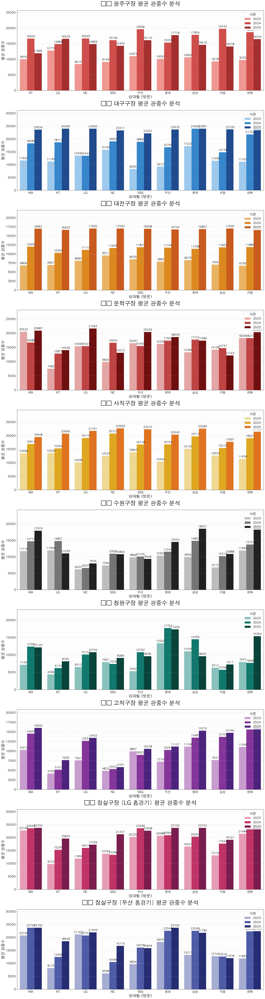

In [168]:
import seaborn as sns

# 1. 디자인 포맷 함수 정의 (y축을 '관중수'에 맞게 수정!)
def format_stadium_ax(ax, stats):
    ax.set_facecolor('#fdfdfd')
    ax.grid(axis='y', linestyle='--', alpha=0.6)
    ax.legend(title='시즌', loc='upper right', fontsize=16, title_fontsize=18)
    ax.set_xlabel('상대팀 (방문)', fontsize=20, fontweight='bold')
    ax.set_ylabel('평균 관중수', fontsize=20, fontweight='bold') # 관중수로 복구!
    ax.tick_params(axis='both', labelsize=16)
    for container in ax.containers:
        # 천 단위 콤마(,)를 넣어서 숫자를 보기 편하게!
        ax.bar_label(container, fmt='%d', padding=5, fontsize=14, fontweight='bold')
    
    # y축 높이를 관중수 데이터에 맞춰 유동적으로 조절
    max_y = stats['관중수'].max() if not stats.empty else 10000
    ax.set_ylim(0, max_y * 1.3)

# 2. 홈팀별 선명한 커스텀 팔레트 (2023년 강화 버전 그대로!)
custom_palettes = {
    '광주': ['#FF8A80', '#E53935', '#B71C1C'], '대구': ['#90CAF9', '#1E88E5', '#0D47A1'],
    '대전': ['#FFB74D', '#FB8C00', '#E65100'], '문학': ['#EF9A9A', '#D32F2F', '#7F0000'],
    '사직': ['#FFE082', '#FFB300', '#FF6F00'], '수원': ['#BDBDBD', '#757575', '#212121'],
    '창원': ['#80CBC4', '#00897B', '#004D40'], '고척': ['#CE93D8', '#8E24AA', '#4A148C'],
    'LG':   ['#F48FB1', '#D81B60', '#880E4F'], '두산': ['#9FA8DA', '#3F51B5', '#1A237E']
}

# 3. 주요 9개 구장 리스트 (가나다순)
major_stadiums_list = ['광주', '대구', '대전', '문학', '사직', '수원', '창원', '고척', '잠실']

# 4. 그래프 그리기 (잠실 분리로 총 10개 공간 확보)
fig, axes = plt.subplots(10, 1, figsize=(20, 75))
ax_idx = 0

for stadium in major_stadiums_list:
    if stadium == '잠실':
        for team in ['LG', '두산']:
            plot_df = df[(df['구장'] == '잠실') & (df['홈'] == team)].copy()
            if plot_df.empty: continue
            
            # 🌟 핵심: 날짜(datetime)에서 연도를 즉석 추출하여 그룹화
            stats = plot_df.groupby([plot_df['날짜'].dt.year.rename('연도'), '방문'])['관중수'].mean().reset_index()
            
            sns.barplot(data=stats, x='방문', y='관중수', hue='연도', palette=custom_palettes.get(team), ax=axes[ax_idx], errorbar=None)
            axes[ax_idx].set_title(f'🏟️ 잠실구장 [{team} 홈경기] 평균 관중수 분석', fontsize=30, fontweight='bold', pad=25)
            format_stadium_ax(axes[ax_idx], stats)
            ax_idx += 1
    else:
        # 나머지 구장들 (사직 롯데 원정 제외 등 필터링 유지)
        plot_df = df[(df['구장'] == stadium) & ~((df['구장'] == '사직') & (df['방문'] == '롯데'))].copy()
        if plot_df.empty: continue
        
        # 🌟 동일하게 날짜에서 연도 추출
        stats = plot_df.groupby([plot_df['날짜'].dt.year.rename('연도'), '방문'])['관중수'].mean().reset_index()
        
        sns.barplot(data=stats, x='방문', y='관중수', hue='연도', palette=custom_palettes.get(stadium, 'viridis'), ax=axes[ax_idx], errorbar=None)
        axes[ax_idx].set_title(f'🏟️ {stadium}구장 평균 관중수 분석', fontsize=30, fontweight='bold', pad=25)
        format_stadium_ax(axes[ax_idx], stats)
        ax_idx += 1

plt.tight_layout()
plt.show()

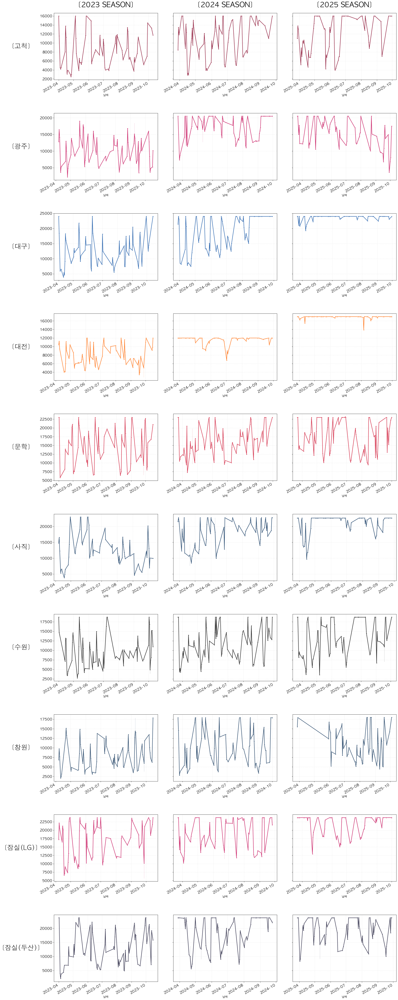

In [169]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. 잠실을 홈팀별로 분리하기 위해 새로운 리스트 생성
# '구장'이 잠실인 경우에만 홈팀 이름을 붙여서 구분합니다.
df['구장_분리'] = df.apply(lambda x: f"잠실({x['홈']})" if x['구장'] == '잠실' else x['구장'], axis=1)

# 2. 분석할 구장 리스트 재정의 (잠실 LG/두산 포함)
major_stadiums_split = [
    '고척', '광주', '대구', '대전', '문학', '사직', '수원', '창원', '잠실(LG)', '잠실(두산)'
]
years = [2023, 2024, 2025]

# 3. 상징색 업데이트 (잠실 분리 및 팀 컬러 반영)
stadium_colors = {
    '광주': '#C30452', '대구': '#074CA1', '대전': '#FF6600', 
    '문학': '#CE0E2D', '사직': '#002955', '수원': '#000000', 
    '창원': '#072C53', '고척': '#820024',
    '잠실(LG)': '#C30452',   # LG 트윈스 상징색
    '잠실(두산)': '#131230'   # 두산 베어스 상징색 (남색)
}

# 4. 캔버스 생성 (분리된 구장 수만큼 행 생성)
fig, axes = plt.subplots(len(major_stadiums_split), len(years), 
                         figsize=(24, 6 * len(major_stadiums_split)), sharey='row')

# 5. 반복문으로 그리기
for i, stadium in enumerate(major_stadiums_split):
    for j, year in enumerate(years):
        # 구장_분리 컬럼으로 필터링!
        data_subset = df[(df['구장_분리'] == stadium) & (df['날짜'].dt.year == year)].sort_values('날짜')
        ax = axes[i, j]
        
        if not data_subset.empty:
            sns.lineplot(data=data_subset, x='날짜', y='관중수', 
                         color=stadium_colors.get(stadium, 'blue'), 
                         linewidth=2, marker='o', markersize=4, alpha=0.8, ax=ax)
        
        # --- 스타일 섹션 ---
        if i == 0:
            ax.set_title(f'[{year} SEASON]', fontsize=30, fontweight='bold', pad=25)
        
        if j == 0:
            ax.set_ylabel(f'[{stadium}]', fontsize=28, fontweight='bold', rotation=0, 
                          labelpad=80, va='center', color='#333333')
        else:
            ax.set_ylabel('')
            
        ax.tick_params(axis='both', which='major', labelsize=16)
        ax.grid(True, linestyle=':', alpha=0.5)
        plt.setp(ax.get_xticklabels(), rotation=30, ha='right')

# 6. 마무리
plt.tight_layout()
plt.subplots_adjust(hspace=0.5, wspace=0.15) 
plt.show()

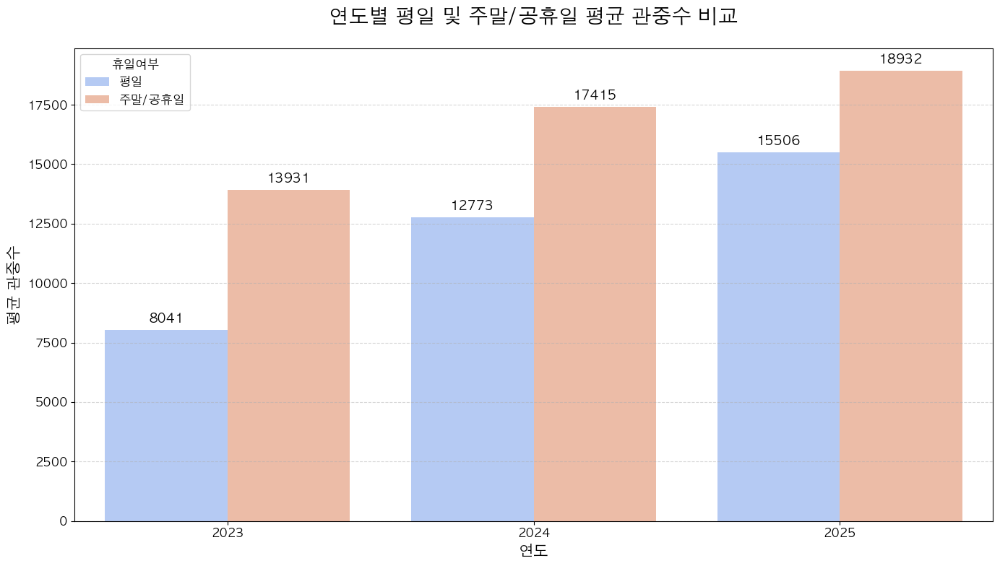

In [170]:
# 주요 공휴일 정의
holidays = pd.to_datetime([
    '2023-05-05', '2023-05-27', '2023-05-29', '2023-06-06', '2023-08-15', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-02', '2023-10-03', '2023-10-09',
    '2024-04-10', '2024-05-05', '2024-05-06', '2024-05-15', '2024-06-06', '2024-08-15', '2024-09-16', '2024-09-17', '2024-09-18', '2024-10-03', '2024-10-09',
    '2025-05-05', '2025-05-06', '2025-06-06', '2025-08-15', '2025-10-03', '2025-10-05', '2025-10-06', '2025-10-07', '2025-10-08', '2025-10-09'
])

# 경기 유형 통합 분류 (평일 vs 주말/공휴일)
def get_simple_category(row):
    if row['날짜'] in holidays or row['요일'] in ['금', '토', '일']:
        return '주말/공휴일'
    else:
        return '평일'

df['휴일여부'] = df.apply(get_simple_category, axis=1)

# 3. 통계 계산 및 시각화
stats_simple = df.groupby([df['날짜'].dt.year.rename('연도'), '휴일여부'])['관중수'].mean().reset_index()

plt.figure(figsize=(14, 8))
sns.barplot(data=stats_simple, x='연도', y='관중수', hue='휴일여부', 
            hue_order=['평일', '주말/공휴일'], palette='coolwarm')

plt.title('연도별 평일 및 주말/공휴일 평균 관중수 비교', fontsize=20, fontweight='bold', pad=25)
plt.ylabel('평균 관중수', fontsize=15)
plt.xlabel('연도', fontsize=15)

# 수치 표시
for container in plt.gca().containers:
    plt.gca().bar_label(container, fmt='%.0f', padding=5, fontsize=13, fontweight='bold')

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#### 평일경기냐 주말경기냐 차이가 많이남

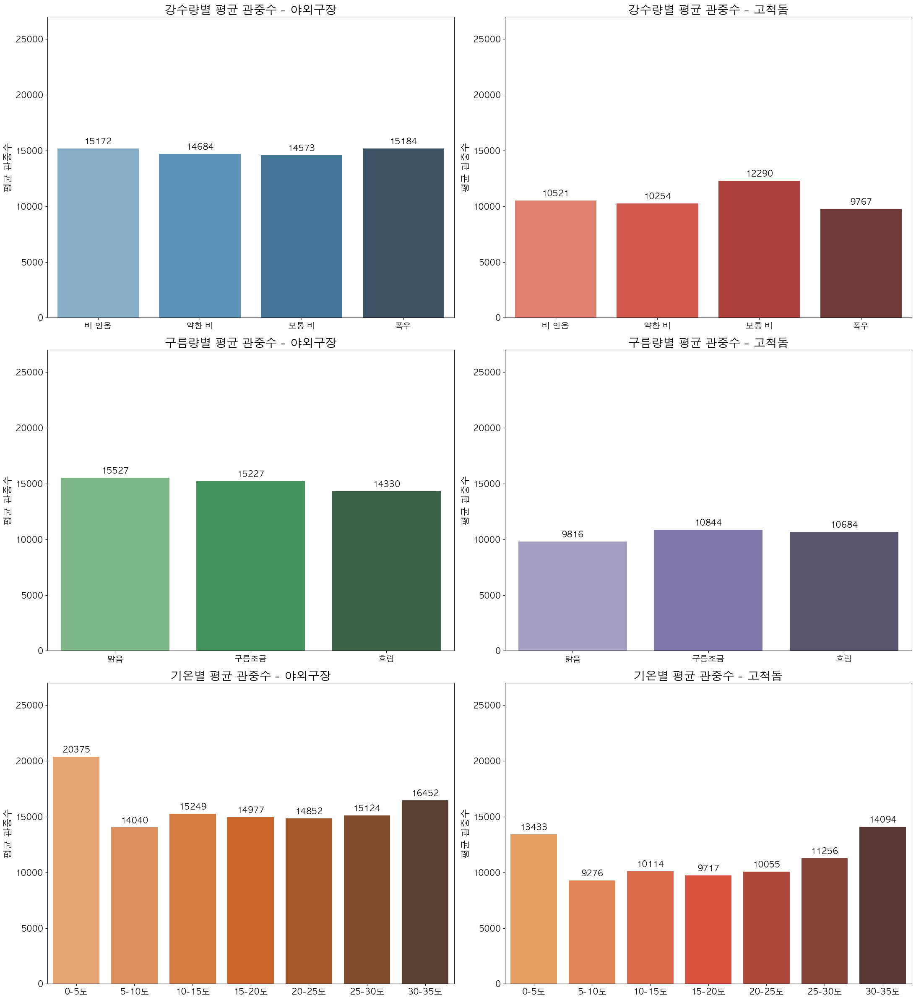

기온별 평균 관중 요약:
기온구간     0-5도         5-10도        10-15도        15-20도        20-25도  \
구장유형                                                                    
고척돔   13433.0   9276.000000  10114.406250   9716.941176  10055.169492   
야외구장  20375.0  14039.673913  15248.577093  14976.558313  14851.521495   

기온구간        25-30도        30-35도  
구장유형                              
고척돔   11255.734177  14094.000000  
야외구장  15123.641628  16451.824561  


In [171]:
# 구간 정의 (강수량, 구름량, 기온)
def rain_cat(x):
    if x == 0: return '비 안옴'
    elif x <= 5: return '약한 비'
    elif x <= 20: return '보통 비'
    else: return '폭우'

df['강수구간'] = df['일강수량(mm)'].apply(rain_cat)
df['구름구간'] = pd.cut(df['평균 전운량(1/10)'], bins=[-1, 3, 7, 11], labels=['맑음', '구름조금', '흐림'])
df['기온구간'] = pd.cut(df['평균기온(°C)'], bins=range(0, 45, 5), labels=[f'{i}-{i+5}도' for i in range(0, 40, 5)])

# 구장 유형 정의 (고척돔 vs 야외구장)
df['구장유형'] = df['구장'].apply(lambda x: '고척돔' if x == '고척' else '야외구장')

# 3. 그래프 생성 (3행 2열 레이아웃)
fig, axes = plt.subplots(3, 2, figsize=(22, 24))

# 축 순서 설정
rain_order = ['비 안옴', '약한 비', '보통 비', '폭우']
cloud_order = ['맑음', '구름조금', '흐림']
# 실제 데이터가 존재하는 기온 구간만 필터링해서 순서 정하기
existing_temp = df['기온구간'].dropna().unique().sort_values()

# [1행] 강수량 분석
sns.barplot(data=df[df['구장유형'] == '야외구장'], x='강수구간', y='관중수', order=rain_order, palette='Blues_d', ax=axes[0, 0], errorbar=None)
axes[0, 0].set_title('강수량별 평균 관중수 - 야외구장', fontsize=20, fontweight='bold')

sns.barplot(data=df[df['구장유형'] == '고척돔'], x='강수구간', y='관중수', order=rain_order, palette='Reds_d', ax=axes[0, 1], errorbar=None)
axes[0, 1].set_title('강수량별 평균 관중수 - 고척돔', fontsize=20, fontweight='bold')

# [2행] 구름량 분석
sns.barplot(data=df[df['구장유형'] == '야외구장'], x='구름구간', y='관중수', order=cloud_order, palette='Greens_d', ax=axes[1, 0], errorbar=None)
axes[1, 0].set_title('구름량별 평균 관중수 - 야외구장', fontsize=20, fontweight='bold')

sns.barplot(data=df[df['구장유형'] == '고척돔'], x='구름구간', y='관중수', order=cloud_order, palette='Purples_d', ax=axes[1, 1], errorbar=None)
axes[1, 1].set_title('구름량별 평균 관중수 - 고척돔', fontsize=20, fontweight='bold')

# [3행] 기온 분석
sns.barplot(data=df[df['구장유형'] == '야외구장'], x='기온구간', y='관중수', order=existing_temp, palette='Oranges_d', ax=axes[2, 0], errorbar=None)
axes[2, 0].set_title('기온별 평균 관중수 - 야외구장', fontsize=20, fontweight='bold')

sns.barplot(data=df[df['구장유형'] == '고척돔'], x='기온구간', y='관중수', order=existing_temp, palette='YlOrRd_d', ax=axes[2, 1], errorbar=None)
axes[2, 1].set_title('기온별 평균 관중수 - 고척돔', fontsize=20, fontweight='bold')

# 4. 공통 디자인 설정
for ax in axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fmt='%.0f', padding=5, fontsize=14, fontweight='bold')
    ax.tick_params(axis='both', labelsize=14)
    ax.set_ylabel('평균 관중수', fontsize=16)
    ax.set_xlabel('')
    ax.set_ylim(0, 27000)

plt.tight_layout()
plt.show()

# 5. 수치 요약 출력 (에러 방지를 위해 존재하는 컬럼만 선택)
temp_summary = df.groupby(['구장유형', '기온구간'])['관중수'].mean().unstack()
temp_summary = temp_summary[existing_temp] # 데이터가 있는 기온 컬럼만 유지
print("기온별 평균 관중 요약:")
print(temp_summary)

#### 0~5도가 저렇게 높은건 개막식때인데 매우 추웠기 때문임 개막식은 거의 만원관중이기 때문에 오류발생주의

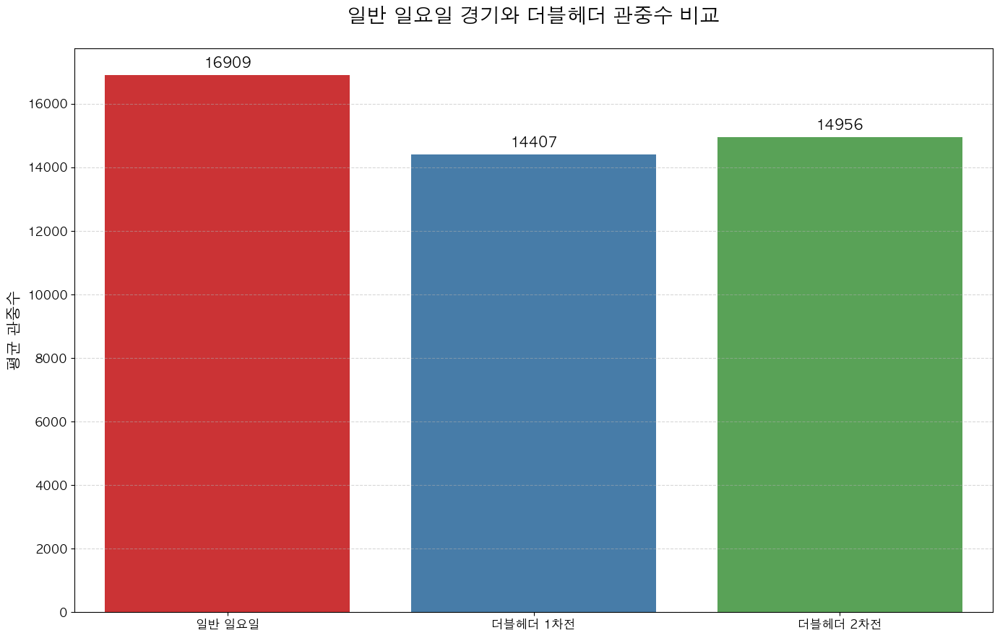

       상세유형           관중수
0    일반 일요일  16908.791304
1  더블헤더 1차전  14406.562500
2  더블헤더 2차전  14956.437500


In [172]:
# 2. 더블헤더(DH) 경기 식별
# 같은 날짜, 같은 구장에 2경기 이상 있는 경우를 찾습니다.
dh_counts = df.groupby(['날짜', '구장']).size().reset_index(name='경기수')
dh_info = dh_counts[dh_counts['경기수'] > 1][['날짜', '구장']]

# 전체 데이터에 더블헤더 여부 병합
df = pd.merge(df, dh_info, on=['날짜', '구장'], how='left', indicator='is_dh')
df['is_dh'] = df['is_dh'].apply(lambda x: True if x == 'both' else False)

# 3. 경기 유형 상세 분류
# 더블헤더 경기들만 따로 떼어서 1차전, 2차전 라벨링
df_dh = df[df['is_dh']].sort_values(['날짜', '구장'])
df_dh['상세유형'] = (df_dh.groupby(['날짜', '구장']).cumcount() + 1).apply(lambda x: f'더블헤더 {x}차전')

# 일반 경기(더블헤더 아님) 중 일요일 경기만 추출
df_regular_sunday = df[(~df['is_dh']) & (df['요일'] == '일')].copy()
df_regular_sunday['상세유형'] = '일반 일요일'

# 비교 분석용 데이터셋 구성
df_comparison = pd.concat([df_dh, df_regular_sunday])

# 4. 통계 계산 및 시각화
summary = df_comparison.groupby('상세유형')['관중수'].mean().reindex(['일반 일요일', '더블헤더 1차전', '더블헤더 2차전']).reset_index()

plt.figure(figsize=(14, 9))
sns.barplot(data=summary, x='상세유형', y='관중수', palette='Set1')

plt.title('일반 일요일 경기와 더블헤더 관중수 비교', fontsize=20, fontweight='bold', pad=25)
plt.ylabel('평균 관중수', fontsize=15)
plt.xlabel('')

# 막대 상단 수치 표시
for container in plt.gca().containers:
    plt.gca().bar_label(container, fmt='%.0f', padding=5, fontsize=14, fontweight='bold')

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# 상세 수치 출력
print(summary)

#### 더블헤더는 관중이 작을 수 밖에 없음

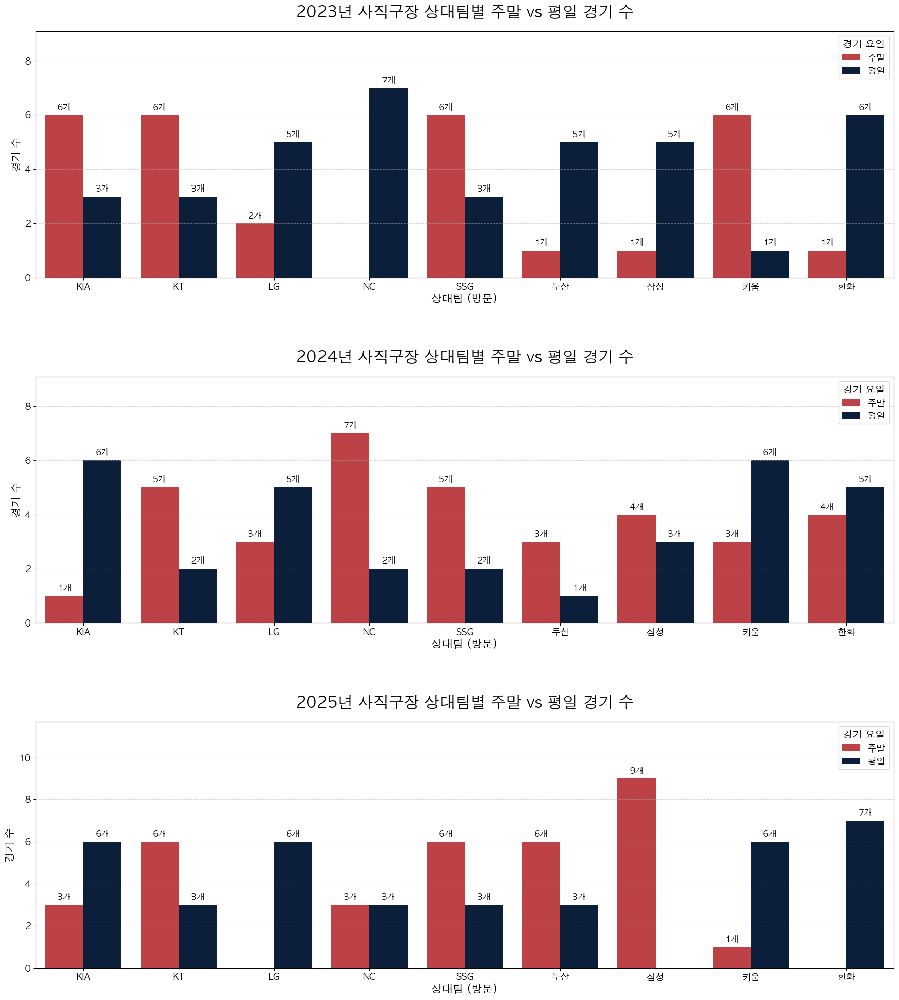

In [173]:
# 1. 사직구장 데이터만 필터링 (오류성 롯데 원정 데이터 제외)
df_sajik = df[(df['구장'] == '사직') & (df['방문'] != '롯데')].copy()

# 2. 주말(금, 토, 일)과 평일 구분하기
weekends = ['금', '토', '일']
df_sajik['주말여부'] = df_sajik['요일'].apply(lambda x: '주말' if x in weekends else '평일')

# 3. 🌟 핵심: 연도별(날짜에서 추출), 상대팀별, 주말/평일 경기 수 집계
# groupby 안에 날짜에서 연도를 즉석 추출해서 '연도'라는 이름을 붙여줍니다.
sajik_counts = df_sajik.groupby([df_sajik['날짜'].dt.year.rename('연도'), '방문', '주말여부']).size().reset_index(name='경기수')

# 4. 그래프 캔버스 세팅
years = [2023, 2024, 2025]
fig, axes = plt.subplots(3, 1, figsize=(18, 20))
custom_colors = {'주말': '#D22D32', '평일': '#041E42'} # 롯데 상징색 느낌으로!

# 5. 연도별로 반복하면서 그래프 그리기
for i, year in enumerate(years):
    # 위에서 만든 '연도' 컬럼으로 필터링
    yearly_data = sajik_counts[sajik_counts['연도'] == year]
    
    if not yearly_data.empty:
        sns.barplot(data=yearly_data, x='방문', y='경기수', hue='주말여부', 
                    palette=custom_colors, ax=axes[i], errorbar=None)
        
        # --- 🌟 가독성 강화 디자인 ---
        axes[i].set_title(f'{year}년 사직구장 상대팀별 주말 vs 평일 경기 수', fontsize=22, fontweight='bold', pad=20)
        axes[i].set_xlabel('상대팀 (방문)', fontsize=15, fontweight='bold')
        axes[i].set_ylabel('경기 수', fontsize=15, fontweight='bold')
        axes[i].grid(axis='y', linestyle='--', alpha=0.5)
        axes[i].legend(title='경기 요일', loc='upper right', fontsize=13, title_fontsize=14)
        
        # 막대 위 숫자 표시 (큼직하게!)
        for container in axes[i].containers:
            axes[i].bar_label(container, fmt='%.0f개', padding=5, fontsize=12, fontweight='bold')
        
        # y축 범위 설정
        max_y = yearly_data['경기수'].max() if not yearly_data.empty else 10
        axes[i].set_ylim(0, max_y * 1.3)
        
        # 축 눈금 글자 크기
        axes[i].tick_params(axis='both', labelsize=13)

plt.tight_layout()
plt.subplots_adjust(hspace=0.4)
plt.show()

#### 생각보다 사직경기에서 상대가 비인기팀일때 관중이 많았던건 주말경기 배치 비율이 높았기 때문이다

🔥 [5월 초 ~ 6월 말] 사직구장 연속 매진 하이라이트 리스트 🔥


,날짜,요일,방문,관중수
0,2025-05-02,금,NC,22669
1,2025-05-03,토,NC,22669
2,2025-05-04,일,NC,22669
3,2025-05-05,월,SSG,22669
4,2025-05-06,화,SSG,22669
5,2025-05-07,수,SSG,22669
6,2025-05-17,토,삼성,22669
7,2025-05-17,토,삼성,22669
8,2025-05-18,일,삼성,22669
9,2025-05-20,화,LG,22669


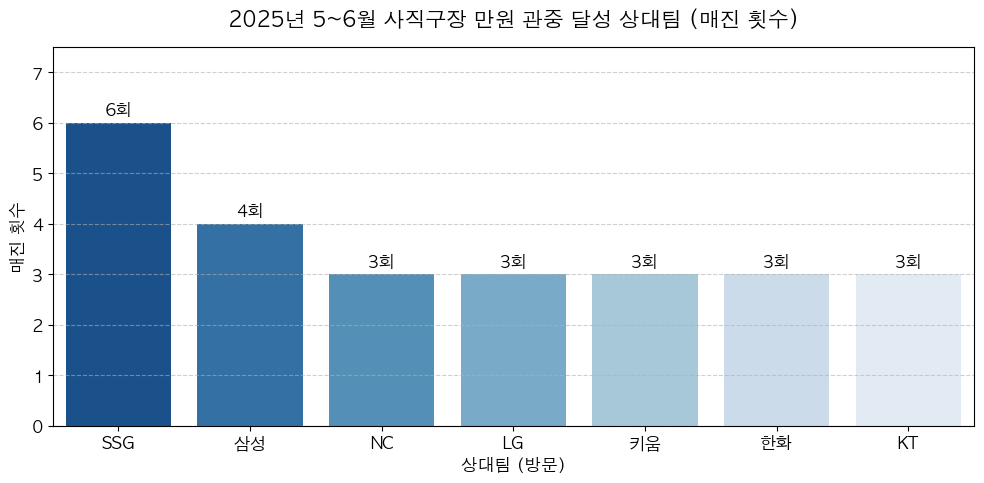

In [174]:
from IPython.display import display
# 2. 사직구장 데이터 필터링
df_sajik = df[df['구장'] == '사직'].copy()

# 3. 🌟 하이라이트 구간 필터링: 2025년 5월 1일 ~ 6월 30일
start_date = '2025-05-01'
end_date = '2025-06-30'
df_highlight = df_sajik[(df_sajik['날짜'] >= start_date) & (df_sajik['날짜'] <= end_date)].copy()

# 4. 만원 관중(매진) 달성 경기만 쏙 빼기 (22,665명 이상)
sellout_may_june = df_highlight[df_highlight['관중수'] >= 22665].copy()

# 5. 시간순으로 보기 좋게 정렬!
sellout_may_june = sellout_may_june.sort_values('날짜')

# 6. 결과 표 출력하기 (display 함수로 주피터에서 예쁘게 출력!)
print("🔥 [5월 초 ~ 6월 말] 사직구장 연속 매진 하이라이트 리스트 🔥")
display(sellout_may_june[['날짜', '요일', '방문', '관중수']].reset_index(drop=True))

# 7. 보너스: 이 기간 동안 매진 타격을 가장 많이 받은 팀 그래프!
plt.figure(figsize=(10, 5))
ax = sns.countplot(data=sellout_may_june, x='방문', palette='Blues_r', order=sellout_may_june['방문'].value_counts().index)

plt.title('2025년 5~6월 사직구장 만원 관중 달성 상대팀 (매진 횟수)', fontsize=15, pad=15)
plt.xlabel('상대팀 (방문)', fontsize=12)
plt.ylabel('매진 횟수', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# 막대기 위에 숫자 달아주기
for container in ax.containers:
    ax.bar_label(container, fmt='%d회', padding=3, fontsize=12, fontweight='bold')

plt.ylim(0, sellout_may_june['방문'].value_counts().max() + 1.5)
plt.tight_layout()
plt.show()

#### 보아하니 주말경기 공휴일경기가 매우큰 영향을 미침

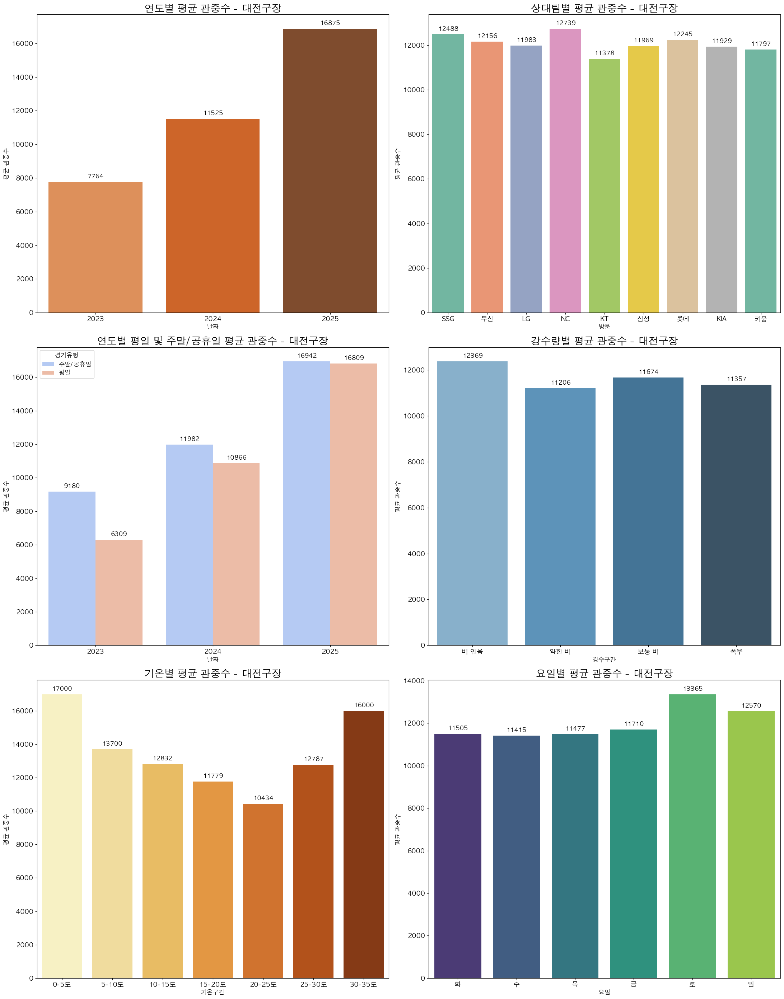

In [175]:
# 대전구장 필터링 및 전처리
daejeon_df = df[df['구장'] == '대전'].copy()

# 공휴일 정의 (2023-2025)
holidays = pd.to_datetime([
    '2023-05-05', '2023-05-27', '2023-05-29', '2023-06-06', '2023-08-15', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-02', '2023-10-03', '2023-10-09',
    '2024-04-10', '2024-05-05', '2024-05-06', '2024-05-15', '2024-06-06', '2024-08-15', '2024-09-16', '2024-09-17', '2024-09-18', '2024-10-03', '2024-10-09',
    '2025-05-05', '2025-05-06', '2025-06-06', '2025-08-15', '2025-10-03', '2025-10-05', '2025-10-06', '2025-10-07', '2025-10-08', '2025-10-09'
])

# 경기 유형 및 날씨 구간 설정
def get_day_type(row):
    if row['날짜'] in holidays or row['요일'] in ['금', '토', '일']:
        return '주말/공휴일'
    else:
        return '평일'

daejeon_df['경기유형'] = daejeon_df.apply(get_day_type, axis=1)

def rain_cat(x):
    if x == 0: return '비 안옴'
    elif x <= 5: return '약한 비'
    elif x <= 20: return '보통 비'
    else: return '폭우'
daejeon_df['강수구간'] = daejeon_df['일강수량(mm)'].apply(rain_cat)
daejeon_df['기온구간'] = pd.cut(daejeon_df['평균기온(°C)'], bins=range(0, 45, 5), labels=[f'{i}-{i+5}도' for i in range(0, 40, 5)])

# 2. 그래프 생성 (3x2 레이아웃)
fig, axes = plt.subplots(3, 2, figsize=(22, 28))

# [1행 1열] 연도별 평균 관중
sns.barplot(data=daejeon_df, x=daejeon_df['날짜'].dt.year, y='관중수', palette='Oranges_d', ax=axes[0, 0], errorbar=None)
axes[0, 0].set_title('연도별 평균 관중수 - 대전구장', fontsize=20, fontweight='bold')

# [1행 2열] 상대팀별 평균 관중
sns.barplot(data=daejeon_df, x='방문', y='관중수', palette='Set2', ax=axes[0, 1], errorbar=None)
axes[0, 1].set_title('상대팀별 평균 관중수 - 대전구장', fontsize=20, fontweight='bold')

# [2행 1열] 경기유형별 관중수
sns.barplot(data=daejeon_df, x=daejeon_df['날짜'].dt.year, y='관중수', hue='경기유형', palette='coolwarm', ax=axes[1, 0], errorbar=None)
axes[1, 0].set_title('연도별 평일 및 주말/공휴일 평균 관중수 - 대전구장', fontsize=20, fontweight='bold')

# [2행 2열] 강수량별 관중수
sns.barplot(data=daejeon_df, x='강수구간', y='관중수', order=['비 안옴', '약한 비', '보통 비', '폭우'], palette='Blues_d', ax=axes[1, 1], errorbar=None)
axes[1, 1].set_title('강수량별 평균 관중수 - 대전구장', fontsize=20, fontweight='bold')

# [3행 1열] 기온별 관중수
existing_temp = daejeon_df['기온구간'].dropna().unique().sort_values()
sns.barplot(data=daejeon_df, x='기온구간', y='관중수', order=existing_temp, palette='YlOrBr', ax=axes[2, 0], errorbar=None)
axes[2, 0].set_title('기온별 평균 관중수 - 대전구장', fontsize=20, fontweight='bold')

# [3행 2열] 요일별 관중수
sns.barplot(data=daejeon_df, x='요일', y='관중수', order=['화', '수', '목', '금', '토', '일'], palette='viridis', ax=axes[2, 1], errorbar=None)
axes[2, 1].set_title('요일별 평균 관중수 - 대전구장', fontsize=20, fontweight='bold')

for ax in axes.flat:
    for container in ax.containers:
        ax.bar_label(container, fmt='%.0f', padding=5, fontsize=12, fontweight='bold')
    ax.tick_params(axis='both', labelsize=13)
    ax.set_ylabel('평균 관중수')

plt.tight_layout()
plt.show()

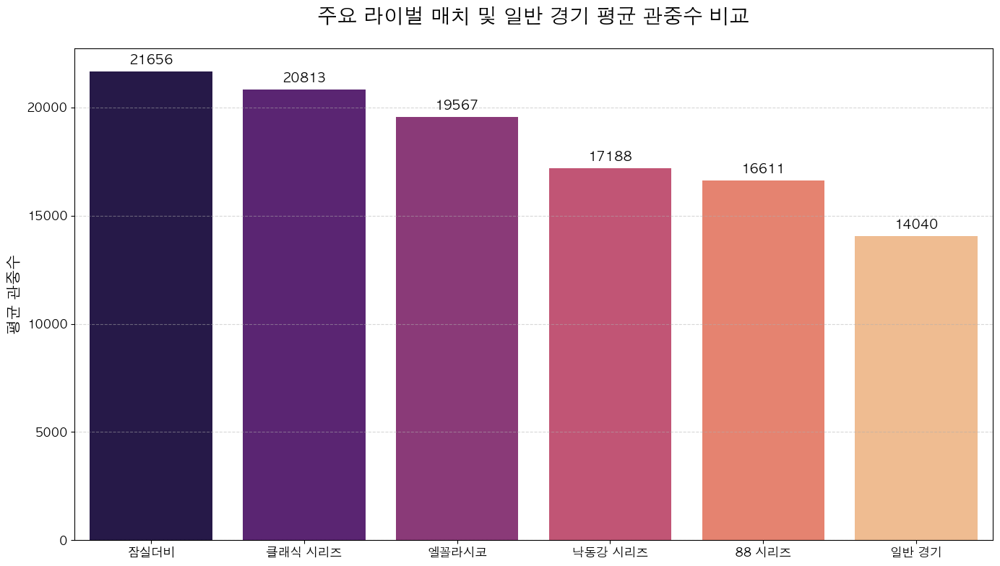

      매치유형           관중수
0     잠실더비  21655.770833
1  클래식 시리즈  20813.133333
2    엘꼴라시코  19567.021739
3  낙동강 시리즈  17187.617021
4   88 시리즈  16610.644444
5    일반 경기  14040.263325


In [176]:
# 라이벌 매치 정의
rivalry_list = [
    (['LG', '롯데'], '엘꼴라시코'),
    (['LG', '두산'], '잠실더비'),
    (['두산', 'LG'], '잠실더비'),
    (['롯데', 'NC'], '낙동강 시리즈'),
    (['NC', '롯데'], '낙동강 시리즈'),
    (['삼성', '롯데'], '클래식 시리즈'),
    (['롯데', '삼성'], '클래식 시리즈'),
    (['KIA', '삼성'], '88 시리즈'),
    (['삼성', 'KIA'], '88 시리즈')
]

# 라이벌 매치 여부 태깅
def check_rivalry(row):
    for teams, name in rivalry_list:
        if (row['홈'] in teams) and (row['방문'] in teams):
            return name
    return '일반 경기'

df['매치유형'] = df.apply(check_rivalry, axis=1)

# 2. 통계 계산
rivalry_stats = df.groupby('매치유형')['관중수'].mean().sort_values(ascending=False).reset_index()

# 3. 시각화
plt.figure(figsize=(14, 8))
sns.barplot(data=rivalry_stats, x='매치유형', y='관중수', palette='magma')

plt.title('주요 라이벌 매치 및 일반 경기 평균 관중수 비교', fontsize=20, fontweight='bold', pad=25)
plt.ylabel('평균 관중수', fontsize=15)
plt.xlabel('')

# 수치 표시
for container in plt.gca().containers:
    plt.gca().bar_label(container, fmt='%.0f', padding=5, fontsize=13, fontweight='bold')

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

print(rivalry_stats)

In [177]:
# 매치유형별 평균 관중수를 구해서 '매치유형_티켓파워'라는 새로운 컬럼으로 만듭니다.
df['매치유형_티켓파워'] = df.groupby('매치유형')['관중수'].transform('mean')

# 확인
print(df[['매치유형', '매치유형_티켓파워', '관중수']].drop_duplicates('매치유형'))

       매치유형     매치유형_티켓파워    관중수
0     일반 경기  14040.263325  18700
37    엘꼴라시코  19567.021739   5286
49     잠실더비  21655.770833  16528
51  클래식 시리즈  20813.133333   9124
78   88 시리즈  16610.644444   6870
79  낙동강 시리즈  17187.617021  12613


#### 라이벌 매치는 관중수가 일반경기보다 많기는 함

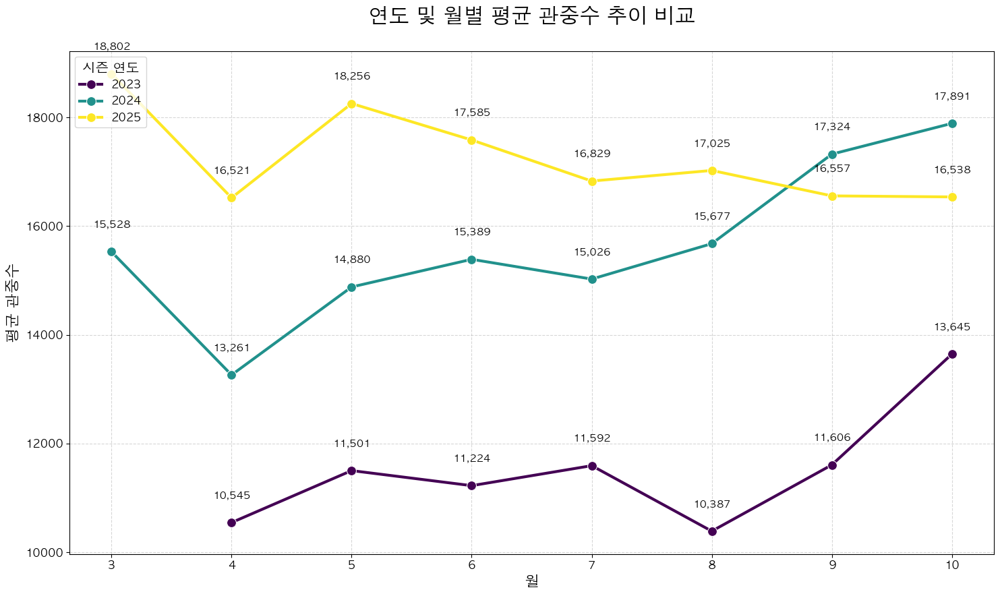

--- 연도별/월별 평균 관중수 상세 표 ---
연도     2023     2024     2025
월                            
3       NaN  15529.0  18802.0
4   10545.0  13262.0  16521.0
5   11502.0  14881.0  18257.0
6   11225.0  15389.0  17586.0
7   11592.0  15026.0  16830.0
8   10387.0  15678.0  17025.0
9   11607.0  17325.0  16557.0
10  13646.0  17891.0  16538.0


In [178]:
# 월 및 연도 컬럼 생성
df['연도'] = df['날짜'].dt.year
df['월'] = df['날짜'].dt.month

# 3. 연도별/월별 평균 관중수 계산
# 보통 야구 시즌인 3월부터 10월까지의 데이터를 분석합니다.
monthly_stats = df.groupby(['연도', '월'])['관중수'].mean().reset_index()

# 4. 시각화 (꺾은선 그래프)
plt.figure(figsize=(15, 9))
sns.lineplot(data=monthly_stats, x='월', y='관중수', hue='연도', 
             marker='o', markersize=10, palette='viridis', linewidth=3)

# 그래프 제목 및 라벨 설정 (이모티콘 제외)
plt.title('연도 및 월별 평균 관중수 추이 비교', fontsize=22, fontweight='bold', pad=30)
plt.xlabel('월', fontsize=16)
plt.ylabel('평균 관중수', fontsize=16)
plt.xticks(range(3, 11))  # 3월부터 10월까지 표시
plt.grid(True, linestyle='--', alpha=0.5)

# 그래프 내 수치 텍스트 표시
for year in monthly_stats['연도'].unique():
    subset = monthly_stats[monthly_stats['연도'] == year]
    for x, y in zip(subset['월'], subset['관중수']):
        plt.text(x, y + 400, f'{int(y):,}', ha='center', va='bottom', 
                 fontsize=11, fontweight='bold', color='black')

plt.legend(title='시즌 연도', fontsize=12, title_fontsize=14, loc='upper left')
plt.tight_layout()
plt.show()

# 5. 수치 데이터 요약 테이블 출력
summary_table = monthly_stats.pivot(index='월', columns='연도', values='관중수')
print("--- 연도별/월별 평균 관중수 상세 표 ---")
print(summary_table.round(0))

#### 2023,2024와 2025의 추이가 좀 다르다

📊 [일간 순위별 평균 관중수]
   홈팀_일간순위      관중수
0      1.0  17744.0
1      2.0  15882.0
2      3.0  15568.0
3      4.0  14690.0
4      5.0  13988.0
5      6.0  13772.0
6      7.0  13676.0
7      8.0  12686.0
8      9.0  13377.0
9     10.0  11309.0


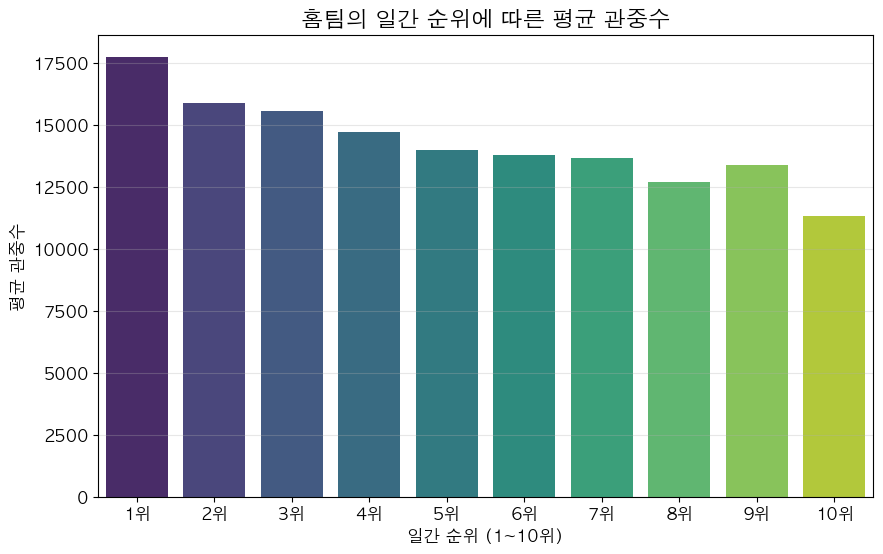

In [179]:
# 2. 누적 승률 및 순위 계산을 위한 데이터 준비
# 각 팀별로 매일의 승/패/무 기록을 길게 늘어뜨립니다.
matches = []
for _, row in df.iterrows():
    date = row['날짜']
    year = row['연도']
    
    # 홈팀 결과
    home_win = 1 if row['승리팀'] == row['홈'] else 0
    home_loss = 1 if row['승리팀'] == row['방문'] else 0
    home_tie = 1 if row['승리팀'] not in [row['홈'], row['방문']] else 0
    matches.append({'날짜': date, '연도': year, '팀명': row['홈'], '승': home_win, '패': home_loss, '무': home_tie})
    
    # 방문팀 결과
    away_win = 1 if row['승리팀'] == row['방문'] else 0
    away_loss = 1 if row['승리팀'] == row['홈'] else 0
    away_tie = 1 if row['승리팀'] not in [row['홈'], row['방문']] else 0
    matches.append({'날짜': date, '연도': year, '팀명': row['방문'], '승': away_win, '패': away_loss, '무': away_tie})

df_matches = pd.DataFrame(matches)

# 3. 팀별, 연도별 누적 승률 계산
# 날짜별로 정렬한 뒤 누적 합계를 구합니다.
df_matches = df_matches.sort_values(by=['연도', '팀명', '날짜'])
df_matches['누적승'] = df_matches.groupby(['연도', '팀명'])['승'].cumsum()
df_matches['누적패'] = df_matches.groupby(['연도', '팀명'])['패'].cumsum()
df_matches['누적무'] = df_matches.groupby(['연도', '팀명'])['무'].cumsum()

# 승률 = 승 / (승 + 패) (무승부는 계산 제외)
df_matches['승률'] = np.where(
    (df_matches['누적승'] + df_matches['누적패']) > 0,
    df_matches['누적승'] / (df_matches['누적승'] + df_matches['누적패']),
    0
)

# 4. 일자별 순위 매기기
# 날짜별로 승률이 높은 순서대로 랭킹을 매깁니다.
daily_rank = df_matches.groupby(['연도', '날짜', '팀명'])['승률'].max().reset_index()
daily_rank['일간순위'] = daily_rank.groupby(['연도', '날짜'])['승률'].rank(method='min', ascending=False)

# 5. 원본 데이터에 '홈팀의 일간 순위' 합치기 (경기 당일 아침 기준 순위를 위해 하루 전 순위를 가져오거나 당일 순위 사용)
df = pd.merge(df, daily_rank[['날짜', '팀명', '일간순위', '승률']], left_on=['날짜', '홈'], right_on=['날짜', '팀명'], how='left')
df = df.rename(columns={'일간순위': '홈팀_일간순위', '승률': '홈팀_승률'}).drop(columns=['팀명'])

# --- 여기서부터는 관중수 분석! ---

# 결측치 제거 (시즌 첫날 등 순위가 겹치는 날 제외)
df_valid = df.dropna(subset=['홈팀_일간순위'])

# 순위별 평균 관중수 집계
rank_attendance = df_valid.groupby('홈팀_일간순위')['관중수'].mean().reset_index()

print("📊 [일간 순위별 평균 관중수]")
print(rank_attendance.round(0))

# 6. 시각화 (선택 사항: 주피터 노트북 등에서 그래프로 볼 때)
plt.figure(figsize=(10, 6))
sns.barplot(data=rank_attendance, x='홈팀_일간순위', y='관중수', palette='viridis')
plt.title('홈팀의 일간 순위에 따른 평균 관중수', fontsize=16)
plt.xlabel('일간 순위 (1~10위)', fontsize=12)
plt.ylabel('평균 관중수', fontsize=12)
plt.xticks(range(10), [f'{i}위' for i in range(1, 11)])
plt.grid(axis='y', alpha=0.3)
plt.show()

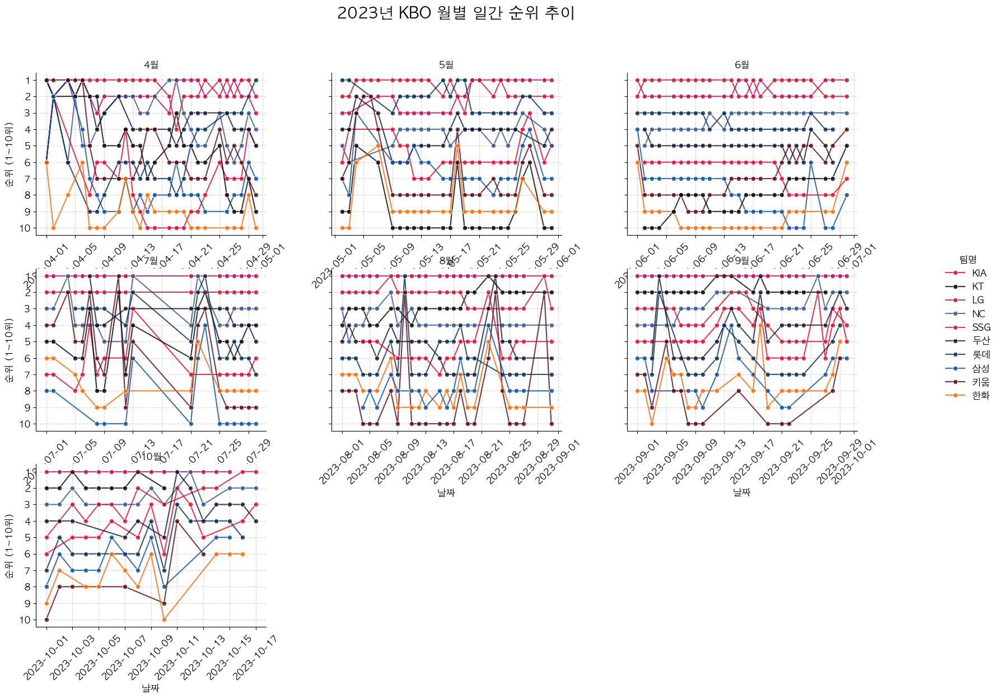

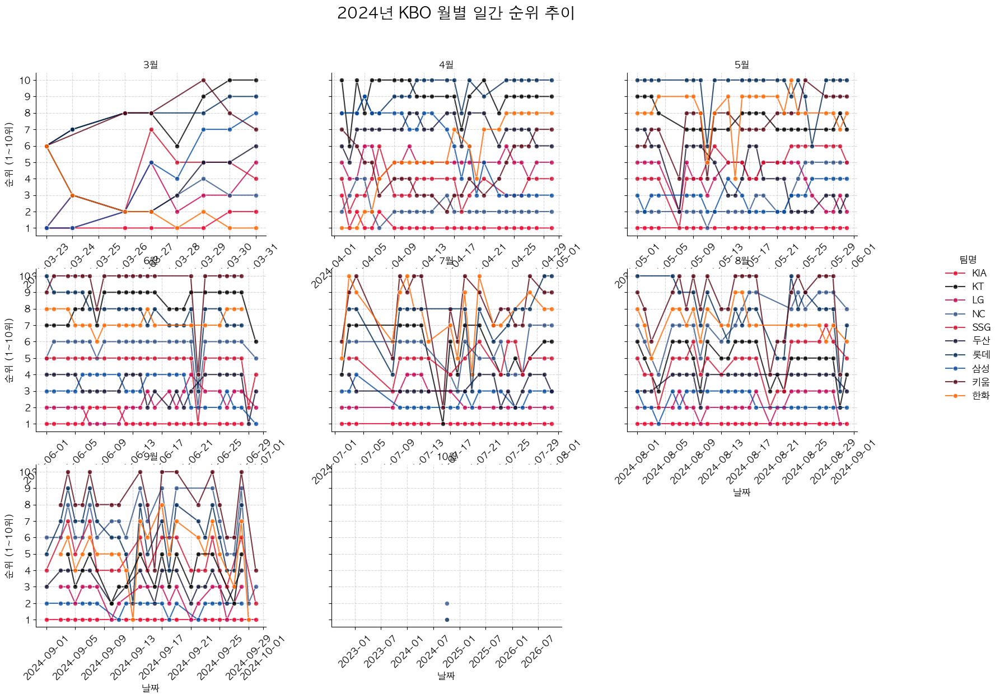

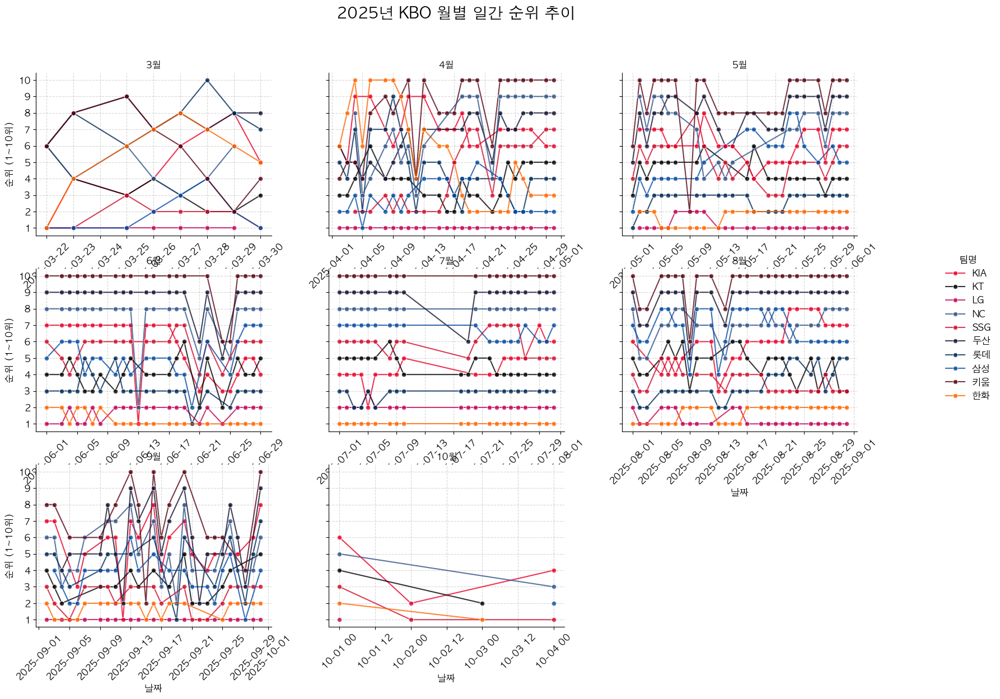

In [180]:

df['월'] = df['날짜'].dt.month

# 2. 누적 승/패/무승부 계산
matches = []
for _, row in df.iterrows():
    home_win = 1 if row['승리팀'] == row['홈'] else 0
    home_loss = 1 if row['승리팀'] == row['방문'] else 0
    matches.append({'날짜': row['날짜'], '연도': row['연도'], '월': row['월'], '팀명': row['홈'], '승': home_win, '패': home_loss})
    
    away_win = 1 if row['승리팀'] == row['방문'] else 0
    away_loss = 1 if row['승리팀'] == row['홈'] else 0
    matches.append({'날짜': row['날짜'], '연도': row['연도'], '월': row['월'], '팀명': row['방문'], '승': away_win, '패': away_loss})

df_matches = pd.DataFrame(matches).sort_values(by=['연도', '팀명', '날짜'])
df_matches['누적승'] = df_matches.groupby(['연도', '팀명'])['승'].cumsum()
df_matches['누적패'] = df_matches.groupby(['연도', '팀명'])['패'].cumsum()

# 승률 계산
df_matches['승률'] = np.where(
    (df_matches['누적승'] + df_matches['누적패']) > 0,
    df_matches['누적승'] / (df_matches['누적승'] + df_matches['누적패']), 0
)

# 3. 매일매일의 1~10위 랭킹 매기기
daily_rank = df_matches.groupby(['연도', '월', '날짜', '팀명'])['승률'].max().reset_index()
daily_rank['일간순위'] = daily_rank.groupby(['연도', '날짜'])['승률'].rank(method='min', ascending=False)

team_colors = {
    'LG': '#C30452', 'KT': '#000000', 'SSG': '#CE0E2D', 'NC': '#315288',
    '두산': '#131230', 'KIA': '#EA0029', '롯데': '#002955', '삼성': '#074CA1',
    '한화': '#FF6600', '키움': '#570514'
}

# 4. 연도별로, 월별 방(Facet)을 만들어서 그리기
years = daily_rank['연도'].unique()

for year in years:
    df_year = daily_rank[daily_rank['연도'] == year]
    if df_year.empty: continue
    
    df_year['월명'] = df_year['월'].astype(str) + '월' # 이름표 붙여주기
    
    # col_wrap=3 으로 한 줄에 3달씩 보여주기! sharex=False로 달마다 x축 끊기
    g = sns.FacetGrid(df_year, col="월명", col_wrap=3, height=4, aspect=1.3, sharex=False)
    
    # 선 그리기
    g.map_dataframe(sns.lineplot, x="날짜", y="일간순위", hue="팀명", palette=team_colors, marker='o', alpha=0.8)
    
    # 디자인 디테일
    g.set_axis_labels("날짜", "순위 (1~10위)")
    g.set_titles(col_template="{col_name}")
    g.set(yticks=range(1, 11))
    
    for ax in g.axes.flat:
        ax.invert_yaxis() # 1위가 위로!
        ax.tick_params(axis='x', rotation=45) # 날짜 겹치지 않게 45도 기울이기
        ax.grid(True, linestyle='--', alpha=0.5)
        
    g.add_legend(title="팀명", bbox_to_anchor=(1.02, 0.5), loc='center left')
    plt.subplots_adjust(top=0.88) # 제목이 겹치지 않게 위쪽 여백 주기
    g.figure.suptitle(f'{year}년 KBO 월별 일간 순위 추이', fontsize=20, fontweight='bold')
    
    plt.show()

In [181]:
# 원본 데이터에 '방문팀의 일간 순위' 합치기
df = pd.merge(df, daily_rank[['날짜', '팀명', '일간순위']], left_on=['날짜', '방문'], right_on=['날짜', '팀명'], how='left')
df = df.rename(columns={'일간순위': '방문팀_일간순위'})
if '팀명' in df.columns:
    df = df.drop(columns=['팀명'])

# 일간 순위 결측치 제거 (시즌 첫날 등)
if '홈팀_일간순위' in df.columns and '방문팀_일간순위' in df.columns:
    df_valid = df.dropna(subset=['홈팀_일간순위', '방문팀_일간순위'])
else:
    df_valid = df

df.head()

,날짜,경기_시간,홈,방문,홈_점수,방문_점수,승리팀,경기_순번,더블헤더냐,실제_진행_순번,요일,구장,관중수,지점,평균기온(°C),일강수량(mm),평균 풍속(m/s),합계 일사량(MJ/m2),평균 전운량(1/10),동원율,구장_분리,휴일여부,강수구간,구름구간,기온구간,구장유형,is_dh,매치유형,매치유형_티켓파워,연도,월,홈팀_일간순위,홈팀_승률,방문팀_일간순위
0,2023-04-01,14:00,KT,LG,11,6,KT,1,0,1,토,수원,18700,119.0,14.7,0.0,1.4,21.67,0.5,100.0,수원,주말/공휴일,비 안옴,맑음,10-15도,야외구장,False,일반 경기,14040.263325,2023,4,1.0,1.0,6.0
1,2023-04-01,14:00,SSG,KIA,4,1,SSG,1,0,1,토,문학,23000,112.0,15.0,0.0,1.9,21.56,1.3,100.0,문학,주말/공휴일,비 안옴,맑음,10-15도,야외구장,False,일반 경기,14040.263325,2023,4,1.0,1.0,6.0
2,2023-04-01,14:00,두산,롯데,12,10,두산,1,0,1,토,잠실,23750,108.0,17.5,0.0,1.8,21.48,1.8,100.0,잠실(두산),주말/공휴일,비 안옴,맑음,15-20도,야외구장,False,일반 경기,14040.263325,2023,4,1.0,1.0,6.0
3,2023-04-01,14:00,삼성,NC,0,8,NC,1,0,1,토,대구,24000,143.0,15.0,0.0,3.3,22.11,0.9,100.0,대구,주말/공휴일,비 안옴,맑음,10-15도,야외구장,False,일반 경기,14040.263325,2023,4,6.0,0.0,1.0
4,2023-04-01,14:00,키움,한화,3,2,키움,1,0,1,토,고척,16000,108.0,17.5,0.0,1.8,21.48,1.8,100.0,고척,주말/공휴일,비 안옴,맑음,15-20도,고척돔,False,일반 경기,14040.263325,2023,4,1.0,1.0,6.0


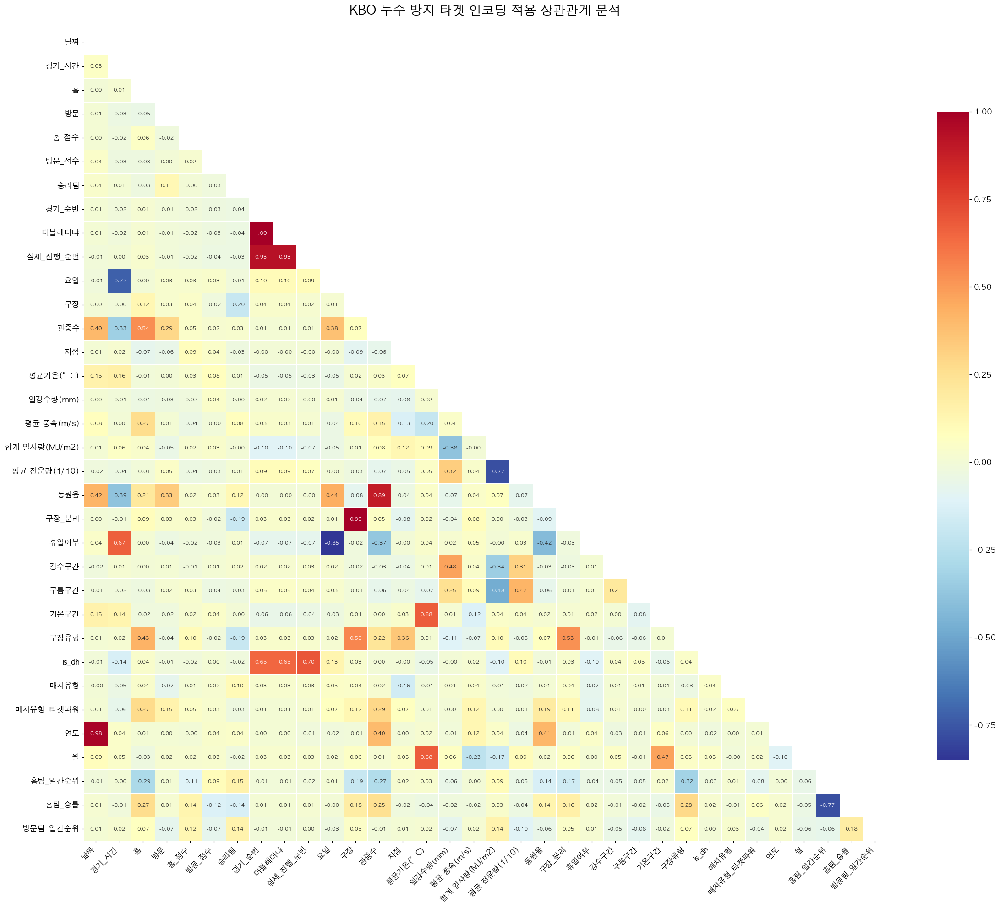

관중수와의 상관관계 영향력 TOP 15 (정정당당 실력!)
동원율              0.885917
홈                0.537245
날짜               0.401863
연도               0.399041
요일               0.378090
휴일여부             0.365649
경기_시간            0.331698
방문               0.286724
매치유형_티켓파워        0.285284
홈팀_일간순위          0.267394
홈팀_승률            0.250548
구장유형             0.224708
평균 풍속(m/s)       0.152805
합계 일사량(MJ/m2)    0.077143
구장               0.074351
Name: 관중수, dtype: float64


In [182]:
from sklearn.preprocessing import LabelEncoder
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. 원본 데이터 복사
df_corr = df.copy()

# 2. 날짜형 데이터 처리
date_cols = df_corr.select_dtypes(include=['datetime64', 'datetime64[ns]']).columns
for col in date_cols:
    df_corr[col] = df_corr[col].astype('int64') // 10**9

# (추가) 3월~8월 데이터만 분리하기 위해 '월' 컬럼 추출
if '월' not in df_corr.columns and '날짜' in df_corr.columns:
    df_corr['월'] = pd.to_datetime(df_corr['날짜']).dt.month

# ==========================================================
# 🌟 3. '타겟 인코딩 (데이터 누수 방지 완벽 적용!)' 🌟
# ==========================================================
# 과거 데이터(3~8월)만 모아서 각 팀/요일별 진짜 '과거 평균 관중수'를 계산합니다.
train_df = df_corr[df_corr['월'] <= 8]

# 만약 3~8월에 한 번도 경기를 안 한 팀이 9월에 튀어나올 경우를 대비한 전체 평균값
fallback_mean = train_df['관중수'].mean()

if '홈' in df_corr.columns:
    # 3~8월 홈팀별 평균 계산
    home_ticket_power = train_df.groupby('홈')['관중수'].mean()
    # 전체 데이터 프레임에 3~8월 평균치를 덮어씌움 (없는 팀은 전체 평균으로 채움)
    df_corr['홈'] = df_corr['홈'].map(home_ticket_power).fillna(fallback_mean)

if '방문' in df_corr.columns:
    # 3~8월 방문팀별 평균 계산
    away_ticket_power = train_df.groupby('방문')['관중수'].mean()
    df_corr['방문'] = df_corr['방문'].map(away_ticket_power).fillna(fallback_mean)

if '요일' in df_corr.columns:
    # (요일이 포함되어 있다면) 3~8월 요일별 평균 계산
    weekday_ticket_power = train_df.groupby('요일')['관중수'].mean()
    df_corr['요일'] = df_corr['요일'].map(weekday_ticket_power).fillna(fallback_mean)

# ==========================================================
# 🌟 4. 나머지 모든 문자열 컬럼 살리기 (라벨 인코딩) 🌟
# ==========================================================
# 라벨 인코딩은 정답을 사용하지 않으므로 전체 데이터에 통째로 적용해도 누수가 아님!
le = LabelEncoder()
string_cols = df_corr.select_dtypes(include=['object', 'category']).columns

for col in string_cols:
    df_corr[col] = le.fit_transform(df_corr[col].astype(str))

# (필요 없다면 '월' 컬럼은 다시 삭제하거나 유지)
# if '월' in df_corr.columns:
#     df_corr = df_corr.drop(columns=['월'])

# 5. 전체 컬럼 상관계수 계산
corr_matrix = df_corr.corr()

# 6. 히트맵 시각화 (컬럼이 늘어났으니 그래프 크기를 조금 키웁니다!)
plt.figure(figsize=(24, 20)) 

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, 
            annot=True, 
            fmt=".2f", 
            cmap='RdYlBu_r', 
            mask=mask, 
            linewidths=0.5, 
            annot_kws={"size": 8},
            cbar_kws={"shrink": .8})

plt.title('KBO 누수 방지 타겟 인코딩 적용 상관관계 분석', fontsize=20, fontweight='bold', pad=25)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# 7. '관중수'와의 상관관계 랭킹!
print("관중수와의 상관관계 영향력 TOP 15 (정정당당 실력!)")
target_corr = corr_matrix['관중수'].drop('관중수') 
print(target_corr.abs().sort_values(ascending=False).head(15))


## 모델돌리기

In [183]:
# ==============================================================================
# 0. 라이브러리 임포트 및 설정
# ==============================================================================
%matplotlib inline
import os
import numpy as np
import pandas as pd
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from matplotlib.ticker import StrMethodFormatter
import IPython.display as display
import warnings
warnings.filterwarnings('ignore')

os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
plt.rc('font', family='AppleGothic')
plt.rcParams['axes.unicode_minus'] = False 

# ==============================================================================
# 1. 통합 데이터 전처리 (단 1번만 실행!)
# ==============================================================================
print("🚀 [Step 1] 통합 데이터 전처리 시작...\n")
df_model = df.copy() 

# 시간, 날짜 처리
if '시간' in df_model.columns:
    df_model['시간'] = df_model['시간'].astype(str).str.split(':').str[0].astype(int)
if '날짜' in df_model.columns:
    df_model['날짜'] = pd.to_datetime(df_model['날짜'])
    if '년도' not in df_model.columns: df_model['년도'] = df_model['날짜'].dt.year
    if '월' not in df_model.columns: df_model['월'] = df_model['날짜'].dt.month

# 잠실 구장 홈팀 기준 분리
df_model['구장'] = df_model['구장'].astype(str)
jamsil_mask = (df_model['구장'] == '잠실') | (df_model['구장'] == '서울') 
df_model.loc[jamsil_mask & (df_model['홈'] == 'LG'), '구장'] = '잠실(LG)'
df_model.loc[jamsil_mask & (df_model['홈'] == '두산'), '구장'] = '잠실(두산)'
df_model['구장명_원본'] = df_model['구장']

# 삭제 목록 지정 (누수 및 에러 방지)
drop_cols = ['관중수', '동원율', '날짜', '년도','홈_점수', '방문_점수', '승리팀', '상태']

# 라벨 인코딩 보존 변수
stadiums = sorted(df_model['구장명_원본'].dropna().unique())
years = sorted(df_model['년도'].dropna().unique())

# 라벨 인코딩 (구장명_원본 제외)
categorical_cols = df_model.select_dtypes(exclude=['number', 'datetime', 'datetime64[ns]', 'bool']).columns
le = LabelEncoder()
for col in categorical_cols:
    if col not in drop_cols and col != '구장명_원본':
        df_model[col] = le.fit_transform(df_model[col].astype(str)).astype(int)

print("✅ [Step 1 완료] 전처리 완료! 이제 모든 모델이 똑같은 'df_model'을 공유합니다.\n")


🚀 [Step 1] 통합 데이터 전처리 시작...

✅ [Step 1 완료] 전처리 완료! 이제 모든 모델이 똑같은 'df_model'을 공유합니다.



In [184]:
# ==============================================================================
# 2. 통합 모델 쌍끌이 학습 (XGBoost, LightGBM, CatBoost)
# ==============================================================================
print("🚀 [Step 2] 3대장 부스팅 트리 모델 독립 학습 시작...\n")

models_dict = {'XGBoost': {}, 'LightGBM': {}, 'CatBoost': {}}

for year in years:
    for stadium in stadiums:
        subset = df_model[(df_model['년도'] == year) & (df_model['구장명_원본'] == stadium)].copy()
        if len(subset) == 0: continue
            
        train_data = subset[subset['월'] <= 8].copy()
        test_data = subset[subset['월'] >= 9].copy()
        if len(train_data) == 0 or len(test_data) == 0: continue
            
        temp_drop_cols = drop_cols + ['구장명_원본']
        X_train = train_data.drop(columns=[c for c in temp_drop_cols if c in train_data.columns]).astype('float32')
        y_train = train_data['관중수'].astype('float32')
        key = f"{year}_{stadium}"
        
        # 1. XGBoost
        xgb_model = xgb.XGBRegressor(n_estimators=300, learning_rate=0.03, max_depth=5, random_state=42, tree_method='hist', n_jobs=1)
        xgb_model.fit(X_train, y_train, verbose=False)
        models_dict['XGBoost'][key] = xgb_model
        
        # 2. LightGBM
        lgb_model = lgb.LGBMRegressor(n_estimators=300, learning_rate=0.03, max_depth=5, random_state=42, n_jobs=1, verbose=-1)
        lgb_model.fit(X_train, y_train)
        models_dict['LightGBM'][key] = lgb_model
        
        # 3. CatBoost
        cat_model = CatBoostRegressor(iterations=300, learning_rate=0.03, depth=5, random_seed=42, loss_function='RMSE', verbose=False)
        cat_model.fit(X_train, y_train)
        models_dict['CatBoost'][key] = cat_model

print(f"✅ [Step 2 완료] 모델 학습 성공! (각각 {len(models_dict['XGBoost'])}개의 구장별 모델 완성)\n")


🚀 [Step 2] 3대장 부스팅 트리 모델 독립 학습 시작...

✅ [Step 2 완료] 모델 학습 성공! (각각 30개의 구장별 모델 완성)



📊 [Step 3] 시계열 종합 시각화 (🌟최대 수용인원 상한선 제약 적용)



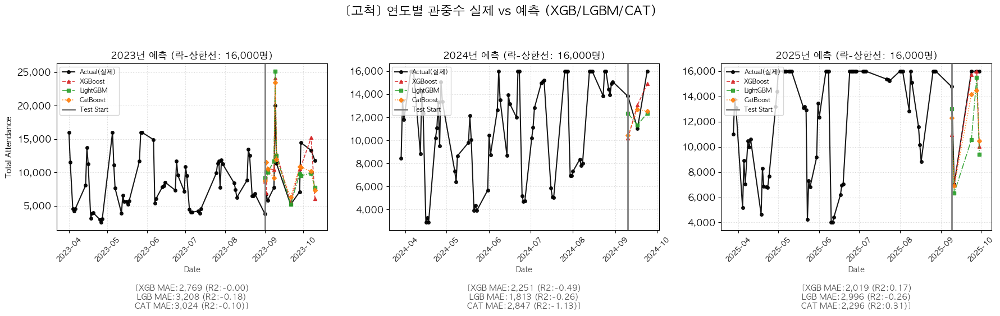

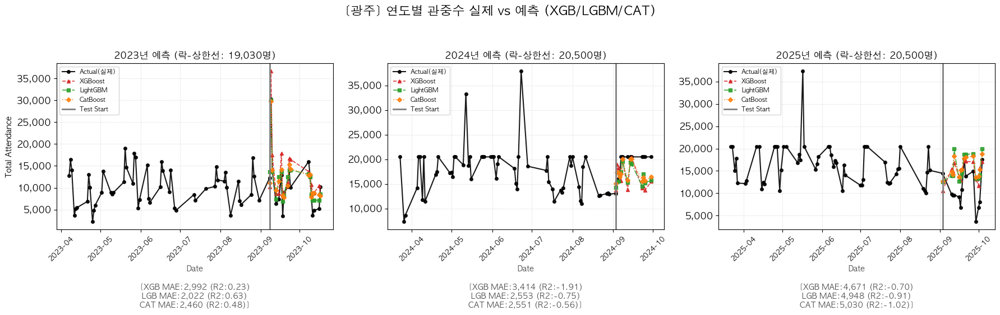

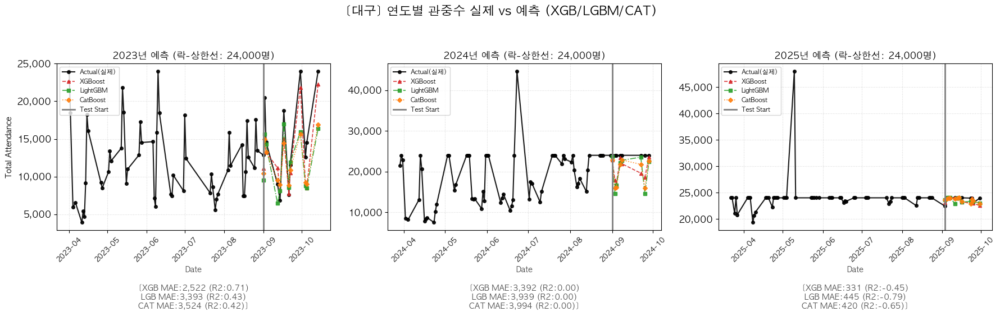

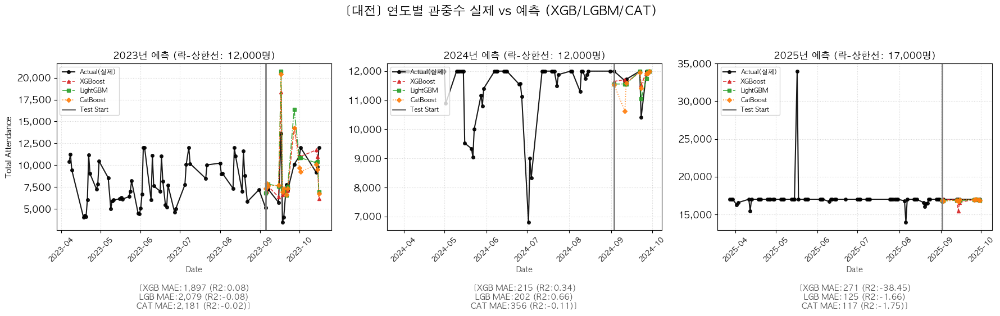

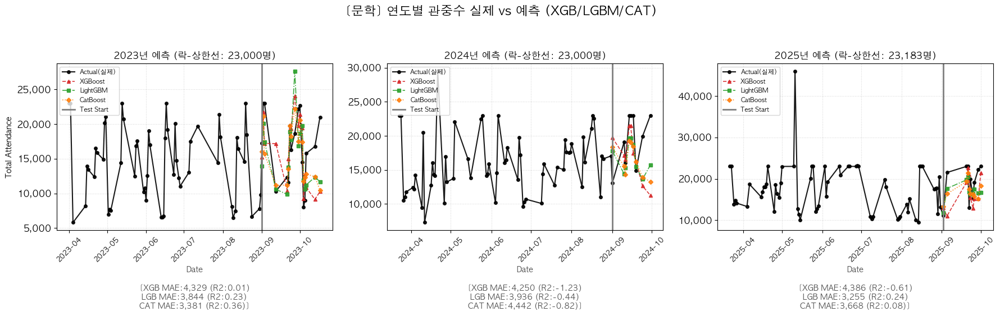

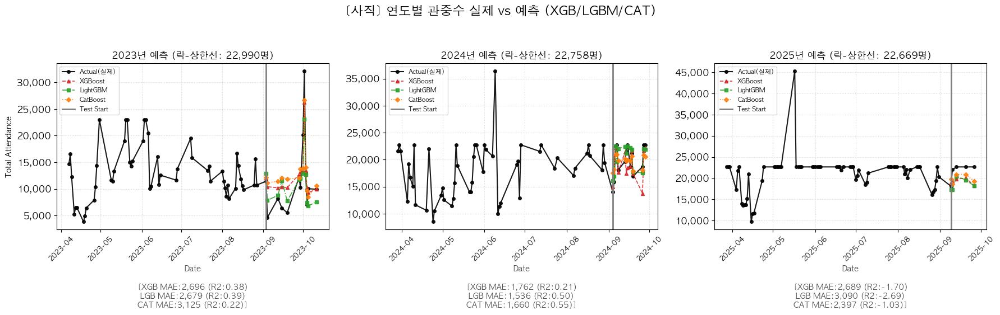

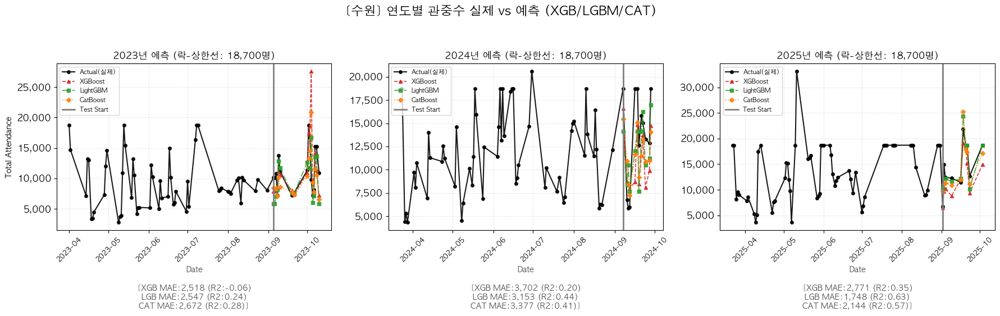

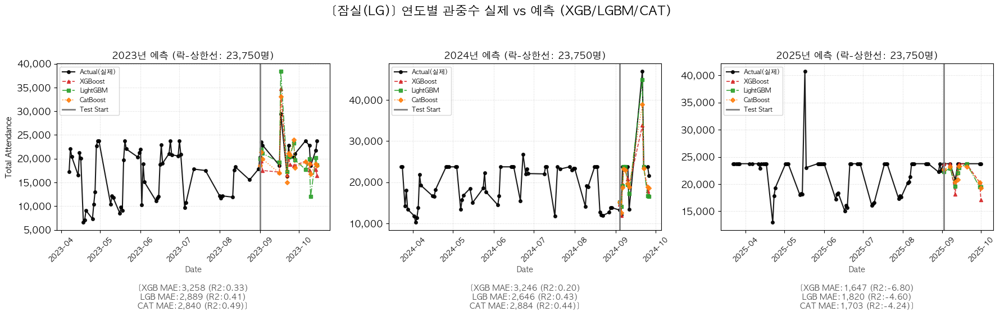

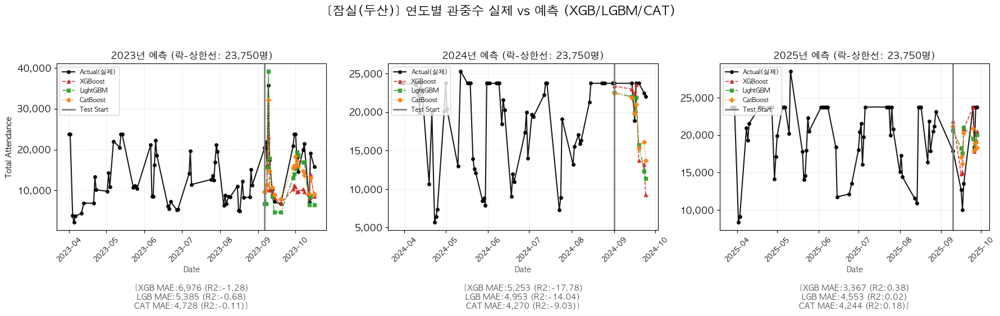

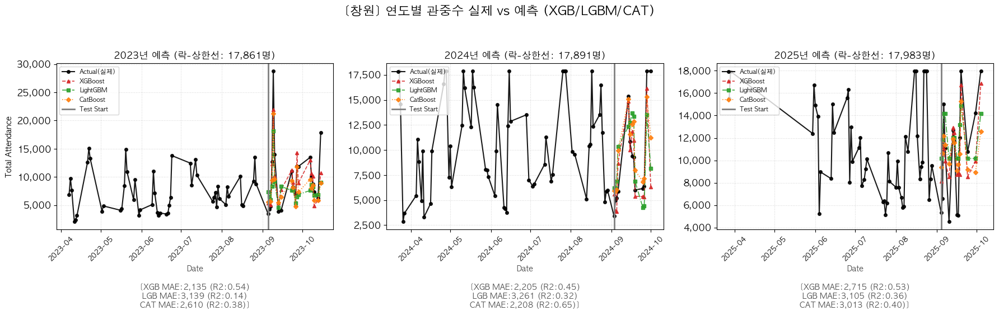

In [185]:
# ==============================================================================
# 3. 통합 시계열 예측 결과 시각화 및 주요 평가지표 산출
# ==============================================================================
print("📊 [Step 3] 시계열 종합 시각화 (🌟최대 수용인원 상한선 제약 적용)\n")

results_summary = []

for stadium in stadiums:
    if not any(f"{year}_{stadium}" in models_dict['XGBoost'] for year in years):
        continue

    fig, axes = plt.subplots(1, len(years), figsize=(6 * len(years), 5))
    axes = np.atleast_1d(axes) 
    fig.suptitle(f'[{stadium}] 연도별 관중수 실제 vs 예측 (XGB/LGBM/CAT)', fontsize=16, fontweight='bold', y=1.05)
    
    for i, year in enumerate(years):
        ax = axes[i]
        key = f"{year}_{stadium}"
        
        if key not in models_dict['XGBoost']:
            ax.set_title(f'{year}년 (데이터 없음)', fontsize=12, color='gray')
            ax.axis('off')
            continue
            
        subset = df_model[(df_model['년도'] == year) & (df_model['구장명_원본'] == stadium)].copy().sort_values('날짜')
        temp_drop_cols = drop_cols + ['구장명_원본']
        
        # 🌟 천재적인 수용 인원 상한선 (물리적 한계치 락!)
        max_capacity = subset['관중수'].max()
        
        plot_df = pd.DataFrame({'Date': subset['날짜'], 'Month': subset['월'], 'Actual': subset['관중수'].values})
        for m in ['XGB', 'LGB', 'CAT']: plot_df[m] = np.nan
        
        test_subset = subset[subset['월'] >= 9]
        if not test_subset.empty:
            y_test_actual = test_subset['관중수'].values
            X_test_only = test_subset.drop(columns=[c for c in temp_drop_cols if c in test_subset.columns]).astype('float32')
            test_indices = test_subset.index
            error_texts = []
            
            for m_name, short_name in [('XGBoost', 'XGB'), ('LightGBM', 'LGB'), ('CatBoost', 'CAT')]:
                preds = models_dict[m_name][key].predict(X_test_only)
                
                # 🌟 제안해주신 핵심 아이디어: 정원 초과 예측치 윗동 잘라버리기!
                preds = np.clip(preds, a_min=0, a_max=max_capacity) 
                
                plot_df.loc[plot_df.index.isin(test_indices), short_name] = preds
                
                mae = mean_absolute_error(y_test_actual, preds)
                rmse = np.sqrt(mean_squared_error(y_test_actual, preds))
                r2 = r2_score(y_test_actual, preds)
                mape = np.mean(np.abs((y_test_actual - preds) / np.maximum(y_test_actual, 1))) * 100
                
                results_summary.append({
                    '모델': m_name, '구장명': stadium, '시즌': year, 
                    'RMSE(명)': rmse, 'MAE(명)': mae, 'R2': r2, 'MAPE(%)': mape
                })
                error_texts.append(f"{short_name} MAE:{mae:,.0f} (R2:{r2:.2f})")
            error_text = "\n".join(error_texts)
        else:
            error_text = "Test 기간 데이터 없음"
            
        plot_df_grouped = plot_df.groupby(['Date', 'Month']).sum(min_count=1).reset_index()
        
        ax.plot(plot_df_grouped['Date'], plot_df_grouped['Actual'], marker='o', markersize=4, label='Actual(실제)', color='black', linewidth=1.5, alpha=0.9)
        ax.plot(plot_df_grouped['Date'], plot_df_grouped['XGB'], marker='^', markersize=4, label='XGBoost', color='#d62728', linestyle='--', linewidth=1.2, alpha=0.9)
        ax.plot(plot_df_grouped['Date'], plot_df_grouped['LGB'], marker='s', markersize=4, label='LightGBM', color='#2ca02c', linestyle='-.', linewidth=1.2, alpha=0.9)
        ax.plot(plot_df_grouped['Date'], plot_df_grouped['CAT'], marker='D', markersize=4, label='CatBoost', color='#ff7f0e', linestyle=':', linewidth=1.2, alpha=0.9)
        
        if not plot_df_grouped[plot_df_grouped['Month'] >= 9].empty:
            ax.axvline(x=plot_df_grouped[plot_df_grouped['Month'] >= 9]['Date'].min(), color='gray', linestyle='-', linewidth=2, label='Test Start')

        ax.set_title(f'{year}년 예측 (락-상한선: {max_capacity:,.0f}명)', fontsize=12)
        ax.set_xlabel(f"Date\n\n[{error_text}]", fontsize=10, fontweight='bold', color='#4f4f4f')
        if i == 0: ax.set_ylabel('Total Attendance', fontsize=10)
        ax.grid(True, linestyle=':', alpha=0.5)
        ax.legend(fontsize=8, loc='upper left')
        ax.tick_params(axis='x', rotation=45, labelsize=9)
        ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
        
    plt.tight_layout()
    fig.subplots_adjust(bottom=0.25)
    display.display(fig)
    plt.close(fig) 



🏆 [모델별 전체 Test 평가 종합 결과 (평균치)]


,모델,RMSE(명),MAE(명),R2,MAPE(%)
0,CatBoost,3334.859,2805.558,-0.478,23.280
1,LightGBM,3509.205,2842.024,-0.709,23.177
2,XGBoost,3656.662,2888.198,-2.212,23.327


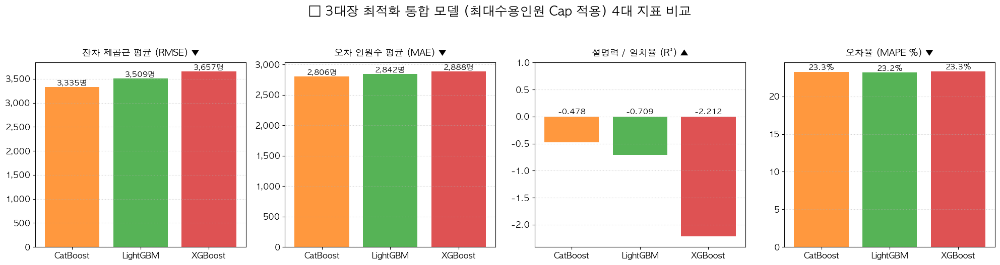

In [186]:
# ==============================================================================
# 4. 최종 모델 4대 지표 성능 비교 막대그래프
# ==============================================================================
if len(results_summary) > 0:
    df_results = pd.DataFrame(results_summary)
    perf_summary = df_results.groupby('모델')[['RMSE(명)', 'MAE(명)', 'R2', 'MAPE(%)']].mean().reset_index().sort_values(by='RMSE(명)')

    print("\n🏆 [모델별 전체 Test 평가 종합 결과 (평균치)]")
    display.display(perf_summary.round(3))

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle('🏆 3대장 최적화 통합 모델 (최대수용인원 Cap 적용) 4대 지표 비교', fontsize=18, fontweight='bold', y=1.05)
    bar_colors = [{'XGBoost': '#d62728', 'LightGBM': '#2ca02c', 'CatBoost': '#ff7f0e'}[m] for m in perf_summary['모델']]

    # RMSE
    bars1 = axes[0].bar(perf_summary['모델'], perf_summary['RMSE(명)'], color=bar_colors, alpha=0.8)
    axes[0].set_title('잔차 제곱근 평균 (RMSE) ▼', fontsize=13, pad=10)
    for bar in bars1: axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height(), f'{bar.get_height():,.0f}명', ha='center', va='bottom', fontweight='bold', fontsize=11)

    # MAE
    bars2 = axes[1].bar(perf_summary['모델'], perf_summary['MAE(명)'], color=bar_colors, alpha=0.8)
    axes[1].set_title('오차 인원수 평균 (MAE) ▼', fontsize=13, pad=10)
    for bar in bars2: axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height(), f'{bar.get_height():,.0f}명', ha='center', va='bottom', fontweight='bold', fontsize=11)

    # R2
    bars3 = axes[2].bar(perf_summary['모델'], perf_summary['R2'], color=bar_colors, alpha=0.8)
    axes[2].set_title('설명력 / 일치율 (R²) ▲', fontsize=13, pad=10)
    axes[2].set_ylim(min(0, perf_summary['R2'].min() - 0.2), 1.0)
    for bar in bars3: axes[2].text(bar.get_x() + bar.get_width()/2, max(bar.get_height(), 0) + 0.02, f'{bar.get_height():.3f}', ha='center', va='bottom', fontweight='bold', fontsize=11)

    # MAPE
    bars4 = axes[3].bar(perf_summary['모델'], perf_summary['MAPE(%)'], color=bar_colors, alpha=0.8)
    axes[3].set_title('오차율 (MAPE %) ▼', fontsize=13, pad=10)
    for bar in bars4: axes[3].text(bar.get_x() + bar.get_width()/2, bar.get_height(), f'{bar.get_height():.1f}%', ha='center', va='bottom', fontweight='bold', fontsize=11)

    for ax in axes:
        ax.grid(axis='y', linestyle=':', alpha=0.6)
        if ax != axes[2] and ax != axes[3]: ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))

    plt.tight_layout()
    display.display(fig)
    plt.close(fig)


🚀 [년도별] XGBoost 모델 독립 학습 및 예측 시계열 분석 시작

✅ 2023년 예측 완료 -> MAE: 2,927명 | RMSE: 3,999명 | R²: 0.53
✅ 2024년 예측 완료 -> MAE: 2,660명 | RMSE: 3,636명 | R²: 0.61
✅ 2025년 예측 완료 -> MAE: 2,513명 | RMSE: 3,446명 | R²: 0.67


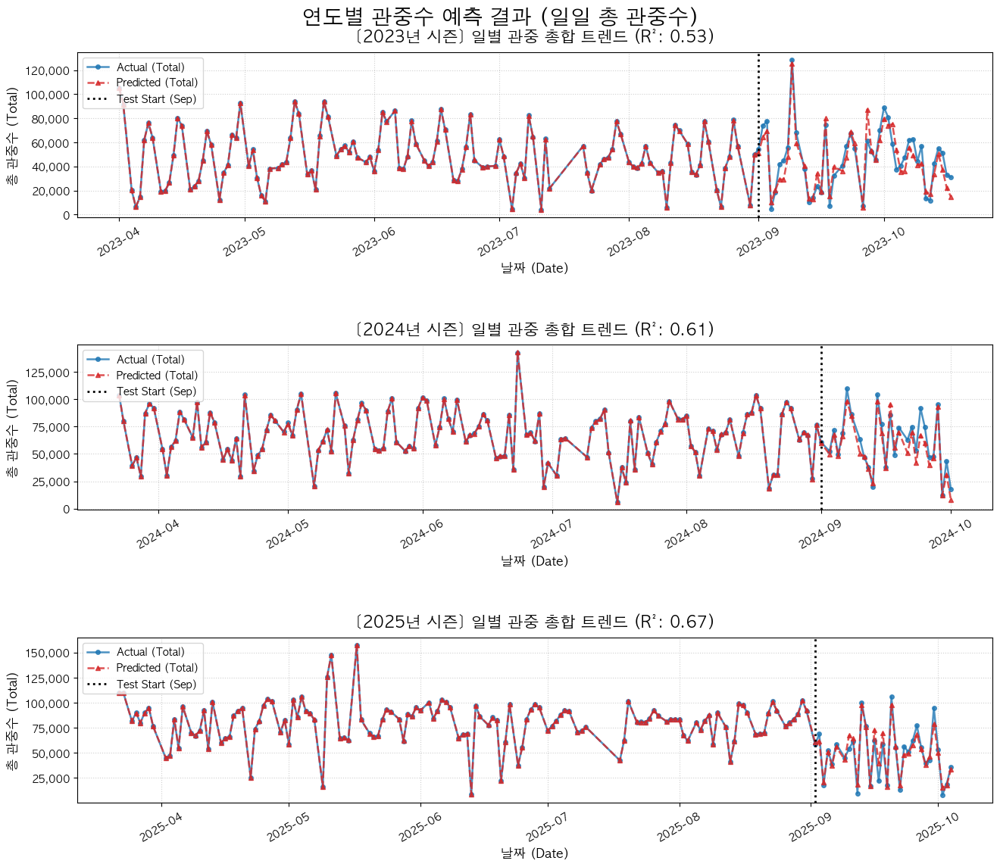

----------------------------------------------------------------------------------------------------


In [187]:
import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
from matplotlib.ticker import StrMethodFormatter
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score # 🌟 r2_score 도구 추가!
from sklearn.preprocessing import LabelEncoder

# 1. 안전하게 복사본 생성 및 시간/날짜 전처리
df_master = df.copy()

if '시간' in df_master.columns:
    df_master['시간'] = df_master['시간'].astype(str).str.split(':').str[0].astype(int)

if '날짜' in df_master.columns:
    df_master['날짜'] = pd.to_datetime(df_master['날짜'])
    if '년도' not in df_master.columns:
        df_master['년도'] = df_master['날짜'].dt.year
    if '월' not in df_master.columns:
        df_master['월'] = df_master['날짜'].dt.month

# 2. 누수 방지 컬럼 선언 (예측에 쓸 수 없는 미래 데이터 타겟팅)
drop_cols = [
    '관중수', '날짜', 
    '동원율',                  
    '홈_점수', '방문_점수', '승리팀', '상태'      
]

# 3. 라벨 인코딩 (문자열 -> 숫자 변환)
categorical_cols = df_master.select_dtypes(exclude=['number', 'datetime', 'datetime64[ns]', 'bool']).columns
le = LabelEncoder()

for col in categorical_cols:
    if col not in drop_cols:
        df_master[col] = le.fit_transform(df_master[col].astype(str)).astype(int)

# 4. 연도 목록 추출
years = sorted(df_master['년도'].unique())

# 맥 한글 폰트 설정
plt.rc('font', family='AppleGothic')
plt.rcParams['axes.unicode_minus'] = False 

# ==============================================================================
# 5. 연도별(Yearly)로 반복하면서 모델 학습 및 시계열 그래프 생성
# ==============================================================================
print("🚀 [년도별] XGBoost 모델 독립 학습 및 예측 시계열 분석 시작\n")

# 🌟 수정됨: 서브플롯 틀을 위아래(행)로 배치 
# nrows=연도 개수, ncols=1열, 가로길이는 12로 넓게 세로길이는 연도당 4씩 할당
fig, axes = plt.subplots(nrows=len(years), ncols=1, figsize=(14, 4 * len(years)))
axes = np.atleast_1d(axes) # 배열 형태 보장

# 큰 제목의 높이를 y=... 조절로 겹치지 않게 세팅
fig.suptitle('연도별 관중수 예측 결과 (일일 총 관중수)', fontsize=20, fontweight='bold', y=0.98)

for i, year in enumerate(years):
    ax = axes[i]
    
    # 해당 연도 데이터만 필터링 후 날짜순 정렬
    year_data = df_master[df_master['년도'] == year].copy().sort_values('날짜')
    
    if len(year_data) == 0:
        ax.set_title(f'{year}년 (데이터 없음)', fontsize=14, color='gray')
        ax.axis('off')
        continue
        
    # Test 기준: 9월 이후
    train_data = year_data[year_data['월'] <= 8].copy()
    test_data = year_data[year_data['월'] >= 9].copy()
    
    if len(train_data) == 0 or len(test_data) == 0:
        print(f"⚠️ {year}년도는 Train 또는 Test 구분이 불가능한 데이터셋입니다. 건너뜁니다.")
        ax.set_title(f'{year}년 (데이터 부족)', fontsize=14, color='gray')
        ax.axis('off')
        continue

    X_train = train_data.drop(columns=[c for c in drop_cols if c in train_data.columns]).astype('float32')
    X_test = test_data.drop(columns=[c for c in drop_cols if c in test_data.columns]).astype('float32')
    
    y_train = train_data['관중수'].astype('float32')
    y_test = test_data['관중수'].astype('float32')
    
    model = xgb.XGBRegressor(
        n_estimators=500,        
        learning_rate=0.03,      
        max_depth=7,             
        random_state=42,
        tree_method="hist",
        n_jobs=1                
    )
    
    model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], verbose=False)
    
    test_predictions = model.predict(X_test)
    train_predictions = model.predict(X_train) 
    
    # 🌟 3대 지표 한 번에 계산
    mae = mean_absolute_error(y_test, test_predictions)
    rmse = np.sqrt(mean_squared_error(y_test, test_predictions))
    r2 = r2_score(y_test, test_predictions) # 🔥 추가된 부분!
    
    # 🌟 출력문에 R2 추가 (보기 편하게 소수점 둘째 자리까지 표기)
    print(f"✅ {year}년 예측 완료 -> MAE: {mae:,.0f}명 | RMSE: {rmse:,.0f}명 | R²: {r2:.2f}")
    
    # 데이터 병합 준비
    train_plot_df = pd.DataFrame({
        'Date': train_data['날짜'],
        'Month': train_data['월'],
        'Actual': y_train.values,
        'Predicted': train_predictions
    })
    test_plot_df = pd.DataFrame({
        'Date': test_data['날짜'],
        'Month': test_data['월'],
        'Actual': y_test.values,
        'Predicted': test_predictions
    })
    
    full_plot_df = pd.concat([train_plot_df, test_plot_df])
    # 하루 총합으로 합산 (가장 핵심)
    full_plot_grouped = full_plot_df.groupby(['Date', 'Month']).sum().reset_index()
    
    # 🌟 그래프 선 그리기
    ax.plot(full_plot_grouped['Date'], full_plot_grouped['Actual'], 
            label='Actual (Total)', color='#1f77b4', marker='o', markersize=4, linewidth=1.8, alpha=0.8)

    ax.plot(full_plot_grouped['Date'], full_plot_grouped['Predicted'], 
            label='Predicted (Total)', color='#d62728', marker='^', markersize=4, linestyle='--', linewidth=1.8, alpha=0.8)

    # 9월 구획 수직선 그리기
    september_first_game = test_plot_df['Date'].min()
    ax.axvline(x=september_first_game, color='black', linestyle=':', linewidth=2, 
               label='Test Start (Sep)')
    
    # 서브플롯 개별 꾸미기 (제목에 R2 점수도 보이게 추가!)
    ax.set_title(f'[{year}년 시즌] 일별 관중 총합 트렌드 (R²: {r2:.2f})', fontsize=15, fontweight='bold', pad=10)
    ax.set_xlabel('날짜 (Date)', fontsize=12)
    ax.set_ylabel('총 관중수 (Total)', fontsize=12) # 위아래 분리되니 모든 그래프에 y축 라벨 추가
        
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(fontsize=10, loc='upper left')
    ax.tick_params(axis='x', rotation=30, labelsize=10) # 가로가 기니까 각도를 30도로 약간만 꺾음
    ax.tick_params(axis='y', labelsize=10)
    
    # y축 값 가독성 높이기 (ex. 100,000)
    ax.yaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))

# 그래프 간격 살짝 띄우기
plt.tight_layout(pad=3.0)
fig.subplots_adjust(top=0.93) 
plt.show()

print("-" * 100)
